# Importing packages

In [1]:
import os
starting_directory = os.getcwd()
print(os.getcwd())

new_dirrectory = '/blue/ferrallm/mcremer/CardiacAmyloidosisMultipleMyeloma'
os.chdir(new_dirrectory)

/blue/ferrallm/mcremer/cardiac-amyloidosis/040_Mistic_2025/SVMsClinicalSplit


In [2]:
import sys
# sys.path.append('/Users/chriskieslich/Box Sync/Research/featureSelection/')

from mistic.svmSet import svmSet
from mistic.cvSet import cvSet 
from mistic.utility import combined_rank, kernelWrapper, score_svc, perDiff, paramSet

import matplotlib.pyplot as plt   
import numpy as np
import pandas as pd
import copy

from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.metrics import roc_auc_score, confusion_matrix
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC

from seaborn import pairplot, clustermap, load_dataset
from scipy.cluster.hierarchy import linkage, dendrogram, leaves_list, fcluster

In [3]:
import pickle

In [4]:
#some functions I wrote to help with exporting data
def outputToExcel(df_data, fileName_header, fileName_Common, fileName_suffix,
                  parent_dir, folderName, sheetName):
    fileName = fileName_header + fileName_Common + fileName_suffix
    outfile_extension = '.xlsx'
    outfile_boxplts = fileName + outfile_extension
    path_out= os.path.join(parent_dir, folderName, outfile_boxplts)

    if os.path.exists(path_out):
            #if old sheet
            with pd.ExcelWriter(path_out, mode = 'a', if_sheet_exists = 'overlay') as writer:
                    df_data.to_excel(writer, sheet_name = sheetName, index = True)
    else: 
            #new sheet
            with pd.ExcelWriter(path_out) as writer:
                    df_data.to_excel(writer, sheet_name = sheetName, index = True) #if new sheet
    
def outputFiguresPath(fileName_header, fileName_mid, fileName_suff, parent_dir, folderName):
        fileName_header = str(fileName_header)
        fileName_mid = str(fileName_mid)
        fileName_suff = str(fileName_suff)

        #cleaning the input to prevent addition of / to the directory
        fileName_header = fileName_header.replace("/", "-")
        fileName_mid = fileName_mid.replace("/", "-")
        fileName_suff = fileName_suff.replace("/", "-")

        fileName = fileName_header + fileName_mid +fileName_suff
        out_filename = fileName + '.tif'
        new_filepath = os.path.join(parent_dir, folderName, out_filename)
        #the output path can be used to save the figure
        return new_filepath
        # plt.savefig(new_filepath, bbox_inches = 'tight')

def makeFolderPathForData(parent_dir, folderName_header, folderName_common, folderName_suffix):
    #makes a new directory for your files
    #returns the folder name for use in other functions
    folderName = folderName_header + folderName_common + folderName_suffix
    path = os.path.join(parent_dir,folderName)
    if not os.path.exists(path):
        os.mkdir(path)
    return folderName

# directory management

In [5]:
# this is written to work out of the blue folder on hpg 

#for file outputs
fileName_header = "SVM_linear_" #what data did you put in
fileName_common = "DescOnly_clinSplit_second_red025_" #what was performed on the data, for figures, this may be added to
fileName_suffix = "_250716_v1" #date and versioning

saving_dirrectory = os.path.join("012 Processed Data","019_clinicalSplit", "SecondFeatRed")
if not os.path.exists(saving_dirrectory):
    os.mkdir(saving_dirrectory)
    
makingFolder = makeFolderPathForData(parent_dir = saving_dirrectory, 
                                     folderName_header = "SVM_linear_DescOnly_clinSplit_second_red025_", 
                                     folderName_common= "250716_", 
                                     folderName_suffix = "v1")

dataFrameFolderOut =  makingFolder #"SVM_Mistic_Output_2024-07-19_v2"
pickleFolderOut = makingFolder

figDirectory = os.path.join("012 Processed Data","019_clinicalSplit")
figFolder = makingFolder 


In [6]:
import matplotlib as mpl

mpl.rcParams['figure.dpi'] = 300

In [7]:
#parameters of SVM 
red_factor = 0

#cross validation and splitting 
test_size_numb = 1/5
numb_sets = 5

rank_weights = [0, 0.15, 0.2, 0.25, 0.3, 0.4, 0.50, 0.6, 0.75, 0.9, 1]
# rank_weights = [0, 0.2, 0.25, 0.3, 0.4, 0.50, 0.6, 0.75, 0.9, 1]

In [8]:
# test set patients selected 1/5 from the sorted mean KPS scores for the CA+ and CA- subgroups of all patients
testSetPatients = ['T-01', 'B-02', 'I-01', 'Y-02', 'F-03', 'B-03', 'F-01', 'G-03', 'Q-01', 'C-01']
trainSetPatients = ['C-03', 'E-01', 'E-02', 'G-02', 'I-03', 'J-02', 'K-02', 'M-02', 'N-03', 'O-03', 'Q-02', 'Q-03', 'V-02', 'W-01', 'X-01', 'X-02',
                    'A-02', 'C-02', 'E-03', 'H-01', 'H-02', 'M-01', 'N-01', 'N-02', 'P-01', 'P-02', 'R-01', 'R-03', 'S-02', 'T-02', 'V-01', 'W-02', 'Y-01', 'Z-01']

# importing our data

In [9]:
dataFileName = "DF_SVM_noNotes_t-60_DescOnly__20250506_v1.xlsx"

This data set contains descriptive statistics and demographic information for patients with known cardiac amyloidosis status. No physician note data was included in the dataset. Time was restricted to 60 days prior to oncologic diagnosis through all positive time points.

In [10]:
# "C:\Users\maega\UFL Dropbox\Maegan Cremer\research-share\Maegan\Projects\Cardiac-Amyloidosis-Multiple-Myeloma\015_Mistic2025\DFsForSVM_noNotes_t-60__20250506_v1\DF_SVM_noNotes_t-60_DescOnly__20250506_v1.xlsx"

In [11]:
#file for the feature list
priorFeaturesName = 'SVM_model_comparison_ClinicalSplit.xlsx'
#sheets with prior selected features for this same starting feature list "feature selection"
#header rows 2, 'model' , 'feature reduction', in column 0
priorFeatures_df = pd.read_excel(priorFeaturesName, sheet_name='best feats', header = [0,1]) #data set we are using
priorModel = 'DescOnly' #original data conditions
priorFeatureRed = 0.25 #feature reduction rate

priorFeaturesList = list(priorFeatures_df[priorModel, priorFeatureRed].dropna())

x_columns_toKeep = priorFeaturesList #features to use in the initial feature list

In [12]:
# Import dataset
dataTable = pd.read_excel(dataFileName, sheet_name = "knownPts", header = 0) #the dataset we are using

dataTable.index = dataTable['DeID']

#columns to drop from the x data (samples and features)
x_columns_toDrop = ['DeID', 'CA_status_yes']

#columns to use for the y data 
y_column_Classification = 'CA_status_yes'

X = dataTable.copy()
X.drop(columns=x_columns_toDrop,inplace=True)
x_columns_Compare = [feature for feature in x_columns_toKeep if feature in X.columns]
X = X[x_columns_Compare]

binary_feats = []
for col in X.columns:
    unique_values = X[col].unique()
    if len(unique_values) == 2:
        binary_feats.append(X.columns.get_loc(col))
X.iloc[:,binary_feats]    

""
DeID
B-02
C-03
E-01
E-02
F-03
G-02
I-01
I-03
J-02


# Setting up classifier

## Scaling data and defining test set

In [13]:
scaler = StandardScaler().set_output(transform = 'pandas')
scaler.fit(X)

X_all = scaler.transform(X)
y_all = dataTable[y_column_Classification]

# X_train, X_test, y_train, y_test = train_test_split(X_all, y_all, 
#                                                     stratify = y_all, 
#                                                     random_state= randomSeed, 
#                                                     test_size= test_size_numb)

X_train = X_all.loc[trainSetPatients]
y_train = y_all.loc[trainSetPatients]
X_test = X_all.loc[testSetPatients]
y_test = y_all.loc[testSetPatients]

# max(X_all[:,0])
X_all.max().max()

6.542258381242707

In [14]:
ID_track_all = dataTable['DeID'].reset_index(drop= True)
ID_track_train = dataTable['DeID'].loc[trainSetPatients].reset_index(drop= True)
ID_track_test= dataTable['DeID'].loc[testSetPatients].reset_index(drop= True)

In [15]:
outputToExcel(df_data=dataTable.loc[trainSetPatients], fileName_header=fileName_header, fileName_Common=fileName_common, fileName_suffix=fileName_suffix, parent_dir=saving_dirrectory,
            folderName= dataFrameFolderOut, sheetName= "train_data")
outputToExcel(df_data=dataTable.loc[testSetPatients], fileName_header=fileName_header, fileName_Common=fileName_common, fileName_suffix=fileName_suffix, parent_dir=saving_dirrectory,
            folderName= dataFrameFolderOut, sheetName= "test_data")

## define cross validation

In [16]:
#convert everything to numpy arrays to get the rest to run 
X_train = X_train.to_numpy()
# y_train = y_train.to_numpy()
X_test = X_test.to_numpy()
# y_test = y_test.to_numpy()
X_all = X_all.to_numpy()

In [17]:
cv_set = cvSet(X = X_train, y = y_train.values)
cv_set.classification(num_sets = numb_sets)

## initiallize SVC and parameter grids

In [18]:
svc = SVC(kernel = 'precomputed', class_weight="balanced", probability=False, tol = 1e-10)

C_range = [2**x for x in range(-8,5)]

kernel_type = "linear"

parameter_grid = []
for cost in C_range:
    parameter_grid.append(paramSet(model={"C": cost},kernel={}))

test = svmSet(svc, cv_set,
              score_method = score_svc().score,
              kernel = kernelWrapper(type = kernel_type),
              separate_parameters = False)

test.tune_models(parameter_grid)
test.performance_ 

{'f1': 0.9333333333333332,
 'auc': 0.9777777777777779,
 'score': 0.9555555555555555,
 'C': 0.0078125}

In [19]:
test_y_predict = test.predict(X_test)
decision_values = test.decision_function(X_test)

tn, fp, fn, tp = confusion_matrix(y_test, test_y_predict).ravel()
precision = tp/(tp+fp)
recall = tp/(tp+fn)
specificity = tn/(tn + fp)
f1 = 2*precision*recall/(precision+recall)
auc = roc_auc_score(y_test, decision_values)

dict_temp_blindpred = {"f1": f1, 'auc': auc, 'true neg': tn, 'false pos': fp, 
                       'false neg': fn, 'true pos': tp,
                       'precision or PPV': precision, 
                       'recall or TPR': recall, 'specificity or TNR': specificity}
dict_temp_blindpred


{'f1': 0.5714285714285715,
 'auc': 1.0,
 'true neg': 5,
 'false pos': 0,
 'false neg': 3,
 'true pos': 2,
 'precision or PPV': 1.0,
 'recall or TPR': 0.4,
 'specificity or TNR': 1.0}

## testing other models

In [20]:
# first testing other models for comparison

from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.linear_model import LogisticRegression
import lightgbm as lgb
from sklearn.model_selection import cross_val_score
from sklearn.metrics import f1_score

In [21]:
rnd_clf = RandomForestClassifier(random_state=0)
rnd_clf.fit(X_train, y_train)
y_pred = rnd_clf.predict(X_test)

print("F1: ", f1_score(y_test, y_pred, average = 'binary'))
print( "ROC: ", roc_auc_score(y_test, y_pred))
importances = rnd_clf.feature_importances_
forest_importances = pd.Series(importances, index= X.columns)
# fig, ax = plt.subplots()
# forest_importances.plot.bar(ax=ax)
# fig.tight_layout()

F1:  0.5
ROC:  0.6


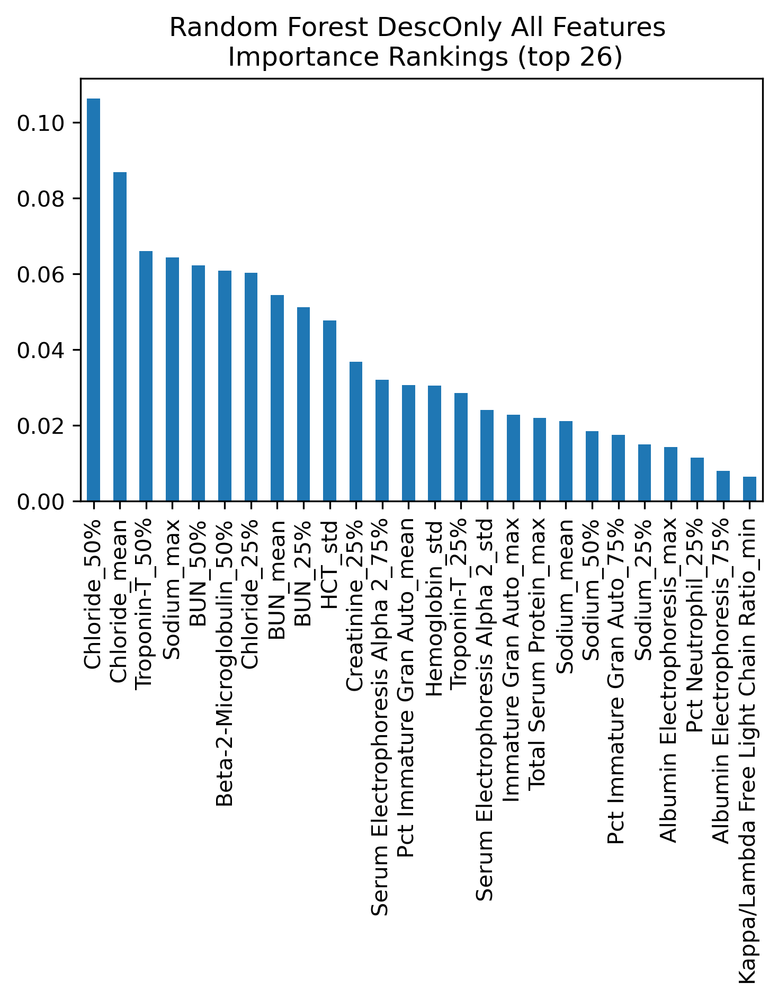

In [22]:
# Sort the importances in descending order and select the top 20 features
top_20_importances = forest_importances.sort_values(ascending=False).head(26)

# Plotting the bar chart for the top 20 features
fig, ax = plt.subplots(figsize = (5,6))
top_20_importances.plot.bar(ax=ax)
fig.tight_layout()
ax.set_title("Random Forest DescOnly All Features \n Importance Rankings (top 26)")

# Show the plot
plt.show()

In [23]:
what_train = pd.DataFrame(X_train, columns = X.columns) 
what_test = pd.DataFrame(X_test, columns = X.columns) 

In [24]:
rnd_clf = RandomForestClassifier(random_state=0)
rnd_clf.fit(what_train[list(top_20_importances.index[:13])], y_train)
y_pred = rnd_clf.predict(what_test[list(top_20_importances.index[:13])])

print("F1: ", f1_score(y_test, y_pred, average = 'binary'))
print( "ROC: ", roc_auc_score(y_test, y_pred))
importances = rnd_clf.feature_importances_
forest_importances = pd.Series(importances, index= what_train[list(top_20_importances.index[:13])].columns)

F1:  0.5
ROC:  0.6


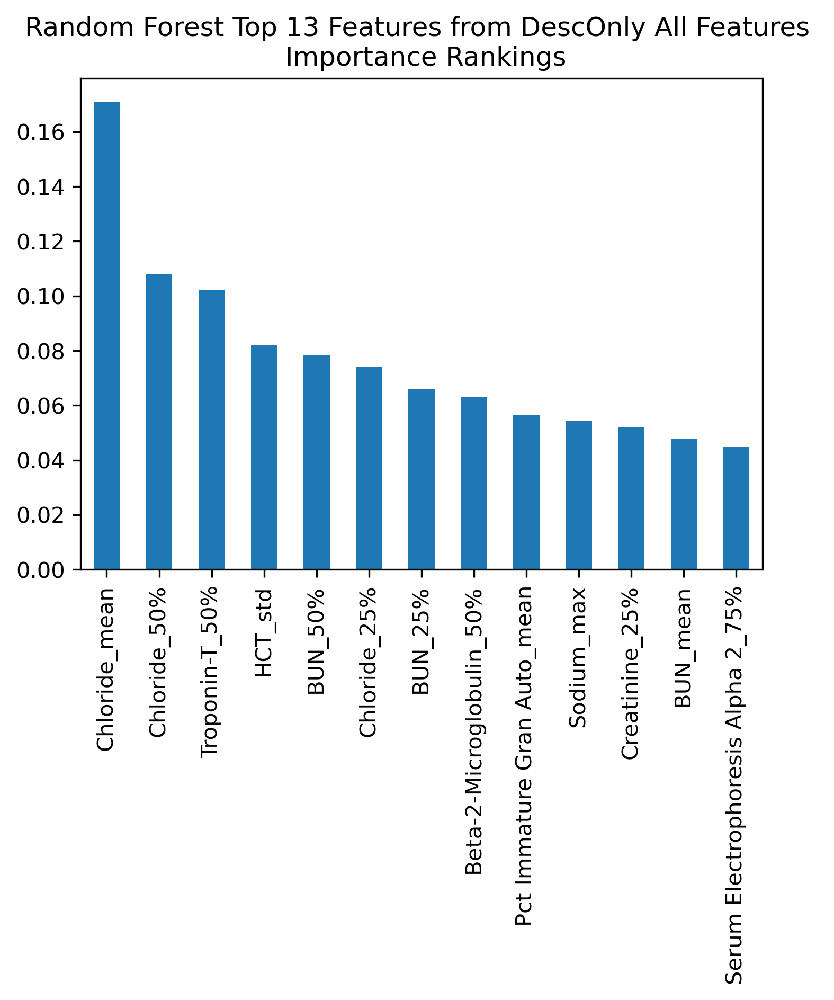

In [25]:
# Plotting the bar chart for the top 20 features
fig, ax = plt.subplots(figsize = (5,6))
forest_importances.sort_values(ascending=False).plot.bar(ax=ax)
fig.tight_layout()
ax.set_title("Random Forest Top 13 Features from DescOnly All Features \n Importance Rankings")

# Show the plot
plt.show()

In [26]:
xgb_clf = XGBClassifier()
xgb_clf.fit(X_train, y_train)
y_pred = xgb_clf.predict(X_test)

print("F1: ", f1_score(y_test, y_pred, average = "binary"))
print("ROC: ", roc_auc_score(y_test, y_pred))

importances_xgb = xgb_clf.feature_importances_
xgb_importances = pd.Series(importances_xgb, index= X.columns)
# fig, ax = plt.subplots()
# xgb_importances.plot.bar(ax=ax)
# ax.set_title("XGBoost All Features Importance Rankings")
# fig.tight_layout()

F1:  0.6666666666666666
ROC:  0.7000000000000002


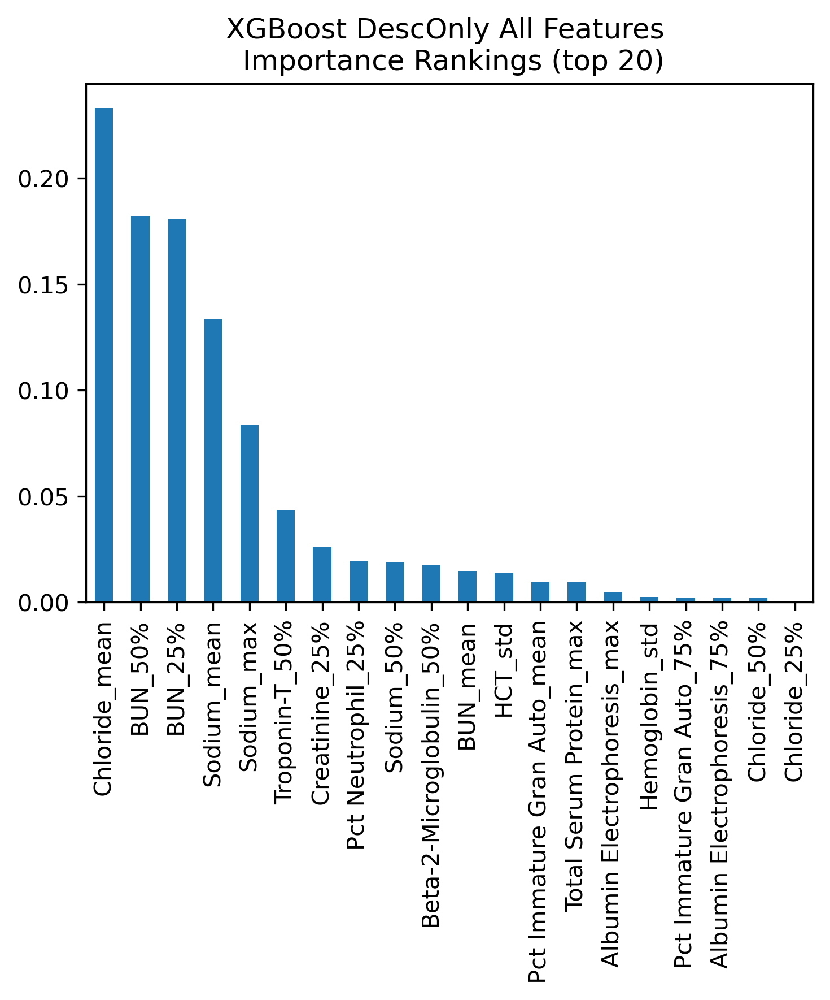

In [27]:
# Sort the importances in descending order and select the top 20 features
top_20_importances = xgb_importances.sort_values(ascending=False).head(20)

# Plotting the bar chart for the top 20 features
fig, ax = plt.subplots(figsize = (5,6))
top_20_importances.plot.bar(ax=ax)
ax.set_title("XGBoost DescOnly All Features \n Importance Rankings (top 20)")
fig.tight_layout()

# Show the plot
plt.show()

In [28]:
# paramsLGBM = {
#     'objective': 'binary',
#     'boosting_type':'gbdt',
#     # 'num_leaves' : 45, 
#     'learning_rate' : 0.05,
#     'feature_fraction' : 0.90,
#     'min_data_in_leaf': 1
# }

# lgb_clf = lgb.LGBMClassifier(**paramsLGBM)
# lgb_clf.fit(X_train, y_train)
# y_pred = lgb_clf.predict(X_test)
# # lgb_clf.predict_proba(X_test)

# print("F1: ", f1_score(y_test, y_pred, average = "binary"))
# print("ROC: ", roc_auc_score(y_test, y_pred))
# print(classification_report(y_test, y_pred))

[LightGBM] [Warning] min_data_in_leaf is set=1, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Info] Number of positive: 16, number of negative: 18
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000033 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 294
[LightGBM] [Info] Number of data points in the train set: 34, number of used features: 26
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.470588 -> initscore=-0.117783
[LightGBM] [Info] 

[LightGBM] [Warning] min_data_in_leaf is set=1, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9


/blue/ferrallm/mcremer/.conda/envs/mcremerConda_2024-07-15_v1/lib/python3.12/site-packages/shap/explainers/_tree.py:448: UserWarning: LightGBM binary classifier with TreeExplainer shap values output has changed to a list of ndarray
  warnings.warn('LightGBM binary classifier with TreeExplainer shap values output has changed to a list of ndarray')


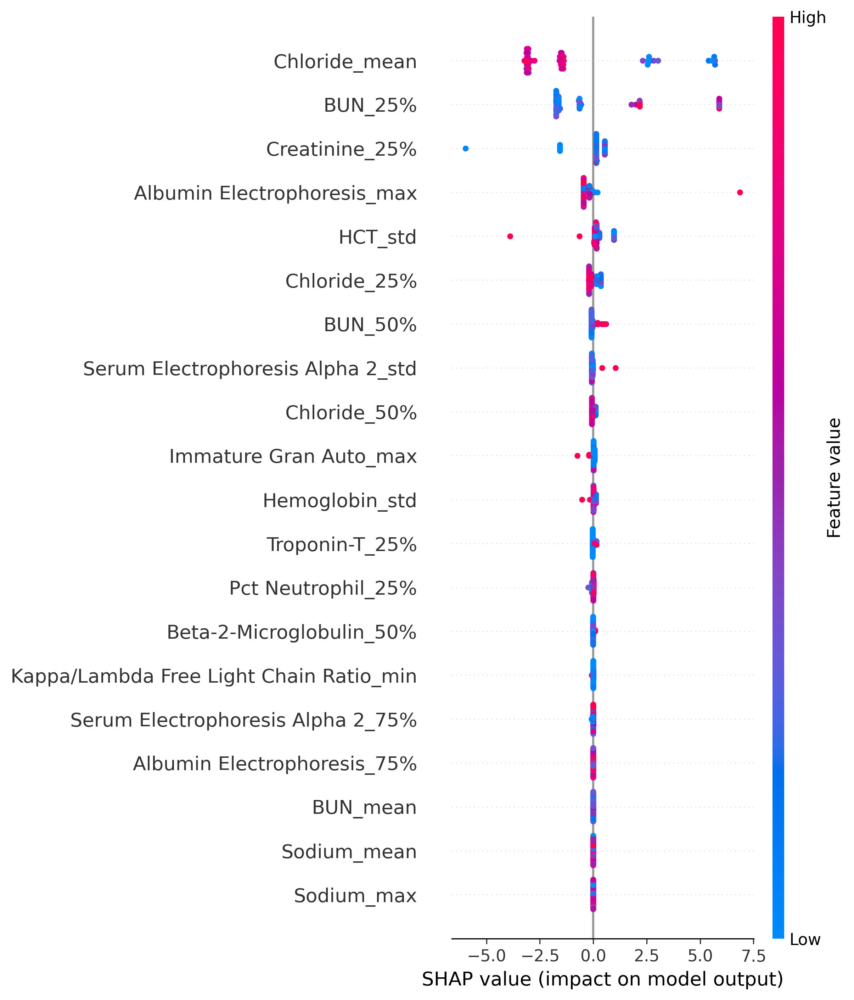

In [29]:
# import shap
# #borrowed from online source and edited
# # create explainer
# explainer = shap.TreeExplainer(lgb_clf)

# #binary predictions
# y_proba = lgb_clf.predict_proba(X_all)[:,1]

# # Calculate SHAP values for the test set
# shap_values = explainer.shap_values(X_all)

# shap.summary_plot(shap_values, X_all, feature_names = X.columns)


# # bar plot for feature importances
# # shap.summary_plot(shap_values_reshaped[1], X_test, plot_type="bar")

# # Show the plot
# plt.show()

# feature selection

In [30]:
svm_set_ranks = []
for i in range(len(rank_weights)):
    print(f"Rank weight: {rank_weights[i]:.2f}")
    svm_set_ranks.append(svmSet(svc, cv_set,
                                score_method = score_svc().score,
                                kernel = kernelWrapper(type = kernel_type),
                                separate_feature_sets = False,
                                separate_parameters = False,
                                sparse_kernel_matrix = False))

    svm_set_ranks[i].greedy_backward_selection(parameter_grid = parameter_grid,
                                           reduction_factor = red_factor,
                                           feature_ranker = combined_rank(weight=rank_weights[i]).compute,
                                           set_for_rank = "sample")

Rank weight: 0.00
Number of Features: 26, Score: 0.956
Number of Features: 25, Score: 0.956
Number of Features: 24, Score: 0.956
Number of Features: 23, Score: 0.969
Number of Features: 22, Score: 0.949
Number of Features: 21, Score: 0.916
Number of Features: 20, Score: 0.921
Number of Features: 19, Score: 0.916
Number of Features: 18, Score: 0.936
Number of Features: 17, Score: 0.936
Number of Features: 16, Score: 0.936
Number of Features: 15, Score: 0.916
Number of Features: 14, Score: 0.930
Number of Features: 13, Score: 0.941
Number of Features: 12, Score: 0.888
Number of Features: 11, Score: 0.899
Number of Features: 10, Score: 0.913
Number of Features: 9, Score: 0.822
Number of Features: 8, Score: 0.854
Number of Features: 7, Score: 0.794
Number of Features: 6, Score: 0.805
Number of Features: 5, Score: 0.835
Number of Features: 4, Score: 0.788
Number of Features: 3, Score: 0.642
Number of Features: 2, Score: 0.609
Number of Features: 1, Score: 0.625
Rank weight: 0.15
Number of F

# Performance plots

## F1 and AUC plots

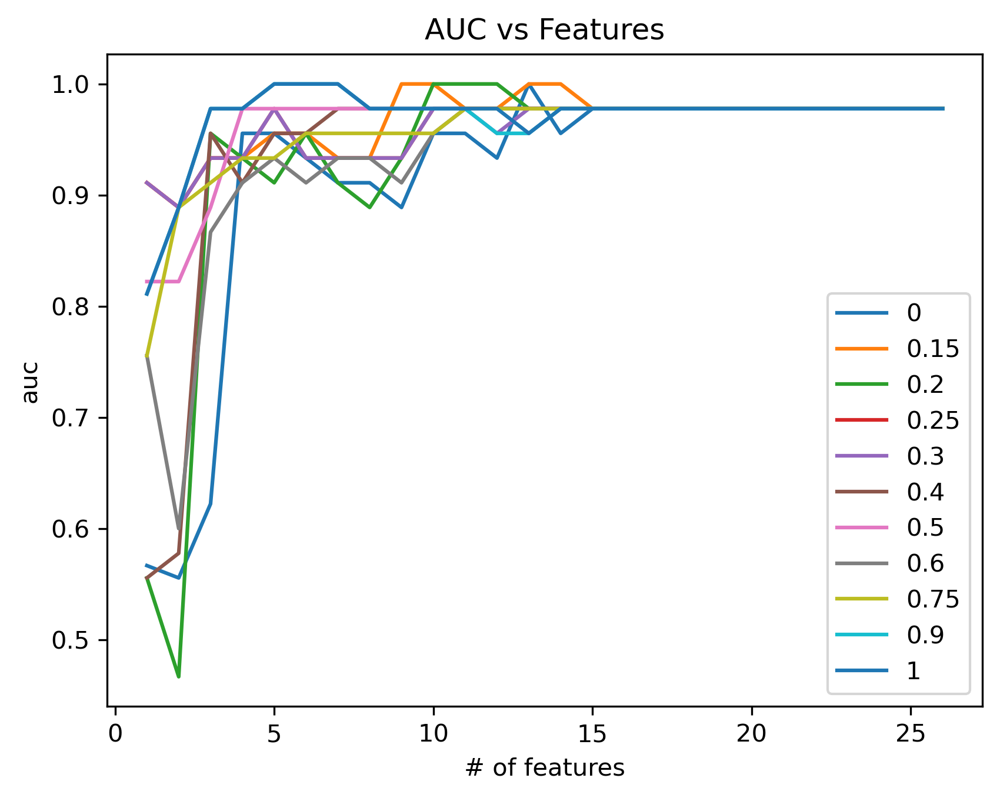

In [31]:
fig, ax = plt.subplots()

for i in range(len(rank_weights)):
    svm_set_ranks[i].plot_performance(metric="auc")

plt.legend(labels=rank_weights)
ax.set_title("AUC vs Features")

#saving figure
figCommon = fileName_common + "_AUC"
figPath = outputFiguresPath(fileName_header=fileName_header, fileName_mid= figCommon, fileName_suff= fileName_suffix, parent_dir= figDirectory, folderName= figFolder)
# fig.savefig(figPath, bbox_inches = 'tight')

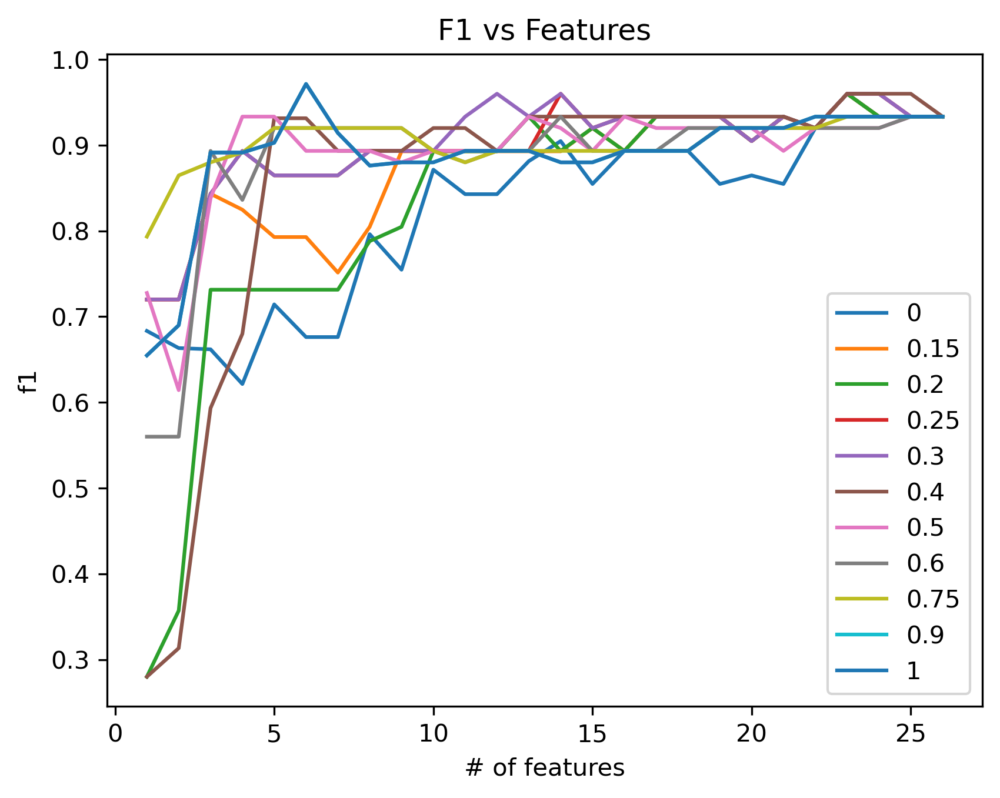

In [32]:
fig, ax = plt.subplots()

for i in range(len(rank_weights)):
    svm_set_ranks[i].plot_performance(metric="f1")

plt.legend(labels=rank_weights)
ax.set_title("F1 vs Features")

#saving figure
figCommon = fileName_common + "_F1"
figPath = outputFiguresPath(fileName_header=fileName_header, fileName_mid= figCommon, fileName_suff= fileName_suffix, parent_dir= figDirectory, folderName= figFolder)
# fig.savefig(figPath, bbox_inches = 'tight')

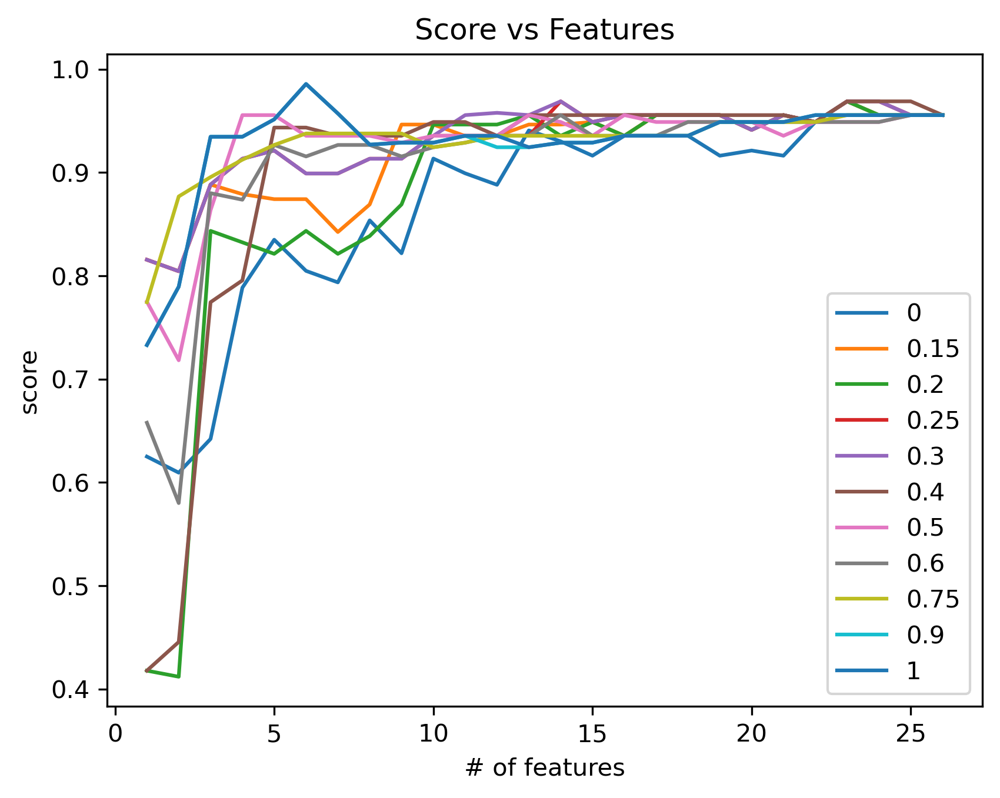

In [33]:
fig, ax = plt.subplots()

for i in range(len(rank_weights)):
    svm_set_ranks[i].plot_performance(metric="score")

plt.legend(labels=rank_weights)
ax.set_title("Score vs Features")

#saving figure
figCommon = fileName_common + "_Score"
figPath = outputFiguresPath(fileName_header=fileName_header, fileName_mid= figCommon, fileName_suff= fileName_suffix, parent_dir= figDirectory, folderName= figFolder)
# fig.savefig(figPath, bbox_inches = 'tight')

# picking best model 

In [34]:
enrich_score = []
for i in range(len(rank_weights)):
    enrich_score.append(svm_set_ranks[i].enrichment_score(type = "auc"))

#selected_run = 4
selected_run = enrich_score.index(max(enrich_score))

enrich_score

[0.8390918803418804,
 0.8865537240537241,
 0.8528937728937728,
 0.894575702075702,
 0.8969688644688645,
 0.8724908424908426,
 0.8934310134310134,
 0.8783028083028085,
 0.8958455433455433,
 0.8961431623931623,
 0.8965705128205127]

In [35]:
svm_set_ranks[selected_run].performance_

{'f1': 0.96,
 'auc': 0.9777777777777779,
 'score': 0.968888888888889,
 'C': 0.03125,
 'num_features': 14,
 'mean_nSV': 19.4}

In [36]:
score_list = []

for i in range(len(rank_weights)):
    score_list.append(svm_set_ranks[i].performance_['score'])

maxScore = max(score_list)
topModelIndex = score_list.index(maxScore)


In [37]:
#saving the feature ranking, performance, and model evaluations to spreadsheets

for i in range(len(rank_weights)):
    #collecting the performance as a dataframe
    df_bestPerformance = pd.DataFrame.from_dict(svm_set_ranks[i].performance_, orient = 'index')
    outputToExcel(df_data=df_bestPerformance, fileName_header=fileName_header, fileName_Common=fileName_common, fileName_suffix=fileName_suffix, parent_dir=saving_dirrectory,
                folderName= dataFrameFolderOut, sheetName= str(rank_weights[i]).replace(".", "") + "_best model perf")


    df_bestFeatures= pd.DataFrame(list(X.columns[svm_set_ranks[i].features]))
    #saving the best features
    outputToExcel(df_data=df_bestFeatures, fileName_header=fileName_header, fileName_Common=fileName_common, fileName_suffix=fileName_suffix, parent_dir=saving_dirrectory,
                folderName= dataFrameFolderOut, sheetName= str(rank_weights[i]).replace(".","") + "_features")




In [38]:
iterator = 1
for i in range(len(rank_weights)):
    if iterator == 1:
        #create the df_performance and collect the performance information
        df_performance = pd.DataFrame.from_dict(svm_set_ranks[i].performance_, orient = 'index', columns = [str(rank_weights[i])]).T

        #create feature list dataframe 
        df_features = pd.DataFrame(list(X.columns[svm_set_ranks[i].features]), columns=[str(rank_weights[i])])
        iterator = iterator + 1 #to increment
    else:
        #collect the data and add it to the existing frames
        df_temp_perf = pd.DataFrame.from_dict(svm_set_ranks[i].performance_, orient = 'index', columns = [str(rank_weights[i])]).T
        df_temp_features = pd.DataFrame(list(X.columns[svm_set_ranks[i].features]), columns=[str(rank_weights[i])])
        #concatinate with pervious
        df_performance = pd.concat([df_performance, df_temp_perf], axis =0)
        df_features = pd.concat([df_features, df_temp_features], axis = 1)
        iterator = iterator + 1

#saving the features and performance
outputToExcel(df_data=df_performance, fileName_header=fileName_header, fileName_Common=fileName_common, fileName_suffix=fileName_suffix, parent_dir=saving_dirrectory,
            folderName= dataFrameFolderOut, sheetName= "concat_best model perf")

outputToExcel(df_data=df_features, fileName_header=fileName_header, fileName_Common=fileName_common, fileName_suffix=fileName_suffix, parent_dir=saving_dirrectory,
            folderName= dataFrameFolderOut, sheetName= "concat_features")

iterator = 1
dict_blindprediction = {} #index is the weight
for i in range(len(rank_weights)):
    decision_values = svm_set_ranks[i].decision_function(X_test)
    y_pred = svm_set_ranks[i].predict(X_test)

    tn, fp, fn, tp = confusion_matrix(y_test, y_pred).ravel()
    precision = tp/(tp+fp)
    recall = tp/(tp+fn)
    specificity = tn/(tn + fp)
    f1 = 2*precision*recall/(precision+recall)
    auc = roc_auc_score(y_test, decision_values)

    dict_temp_blindpred = {"f1": f1, 'auc': auc, 'true neg': tn, 'false pos': fp, 'false neg': fn, 'true pos': tp,
                           'precision or PPV': precision, 'recall or TPR': recall, 'specificity or TNR': specificity}
    if iterator == 1:
        df_blindprediction = pd.DataFrame.from_dict(data = dict_temp_blindpred, orient = 'index', columns = [str(rank_weights[i])]).T
        iterator = iterator +1
    else:
        df_temp_blindpred = pd.DataFrame.from_dict(data = dict_temp_blindpred, orient = 'index', columns = [str(rank_weights[i])]).T
        df_blindprediction = pd.concat([df_blindprediction, df_temp_blindpred], axis = 0)
        iterator = iterator + 1
    # print(df_temp_blindpred)
    # dict_blindprediction[str(rank_weights[i])] = df_temp_blindpred

# df_blindprediction = pd.DataFrame.from_dict(dict_blindprediction, orient= 'index')
outputToExcel(df_data=df_blindprediction, fileName_header=fileName_header, fileName_Common=fileName_common, fileName_suffix=fileName_suffix, parent_dir=saving_dirrectory,
            folderName= dataFrameFolderOut, sheetName= "concat_blindprediction")


In [39]:
df_blindprediction

,f1,auc,true neg,false pos,false neg,true pos,precision or PPV,recall or TPR,specificity or TNR
0,0.571429,1.00,5.0,0.0,3.0,2.0,1.000000,0.4,1.0
0.15,0.571429,1.00,5.0,0.0,3.0,2.0,1.000000,0.4,1.0
0.2,0.571429,1.00,5.0,0.0,3.0,2.0,1.000000,0.4,1.0
0.25,0.750000,0.92,5.0,0.0,2.0,3.0,1.000000,0.6,1.0
0.3,0.750000,0.92,5.0,0.0,2.0,3.0,1.000000,0.6,1.0
0.4,0.571429,1.00,5.0,0.0,3.0,2.0,1.000000,0.4,1.0
0.5,1.000000,1.00,5.0,0.0,0.0,5.0,1.000000,1.0,1.0
0.6,0.750000,0.96,5.0,0.0,2.0,3.0,1.000000,0.6,1.0
0.75,0.750000,1.00,5.0,0.0,2.0,3.0,1.000000,0.6,1.0
0.9,0.500000,0.76,4.0,1.0,3.0,2.0,0.666667,0.4,0.8


In [40]:
df_performance

,f1,auc,score,C,num_features,mean_nSV
0,0.960000,0.977778,0.968889,0.007812,23.0,24.4
0.15,0.960000,0.977778,0.968889,0.007812,23.0,24.4
0.2,0.960000,0.977778,0.968889,0.007812,23.0,24.4
0.25,0.960000,0.977778,0.968889,0.031250,14.0,19.4
0.3,0.960000,0.977778,0.968889,0.031250,14.0,19.4
0.4,0.960000,0.977778,0.968889,0.007812,23.0,24.4
0.5,0.933333,0.977778,0.955556,2.000000,4.0,9.0
0.6,0.933333,0.977778,0.955556,0.015625,14.0,22.8
0.75,0.933333,0.977778,0.955556,0.015625,23.0,20.8
0.9,0.971429,1.000000,0.985714,16.000000,6.0,6.4


In [41]:
df_features

,0,0.15,0.2,0.25,0.3,0.4,0.5,0.6,0.75,0.9,1
0,Albumin Electrophoresis_75%,Albumin Electrophoresis_75%,Albumin Electrophoresis_75%,Albumin Electrophoresis_75%,Albumin Electrophoresis_75%,Albumin Electrophoresis_75%,Creatinine_25%,Albumin Electrophoresis_max,Albumin Electrophoresis_75%,Albumin Electrophoresis_max,Albumin Electrophoresis_max
1,Albumin Electrophoresis_max,Albumin Electrophoresis_max,Albumin Electrophoresis_max,Albumin Electrophoresis_max,Albumin Electrophoresis_max,Albumin Electrophoresis_max,Pct Immature Gran Auto_mean,BUN_50%,Albumin Electrophoresis_max,Beta-2-Microglobulin_50%,Beta-2-Microglobulin_50%
2,BUN_mean,BUN_mean,BUN_mean,BUN_25%,BUN_25%,BUN_25%,Serum Electrophoresis Alpha 2_std,Beta-2-Microglobulin_50%,BUN_25%,Pct Immature Gran Auto_mean,Pct Immature Gran Auto_mean
3,BUN_25%,BUN_25%,BUN_25%,Beta-2-Microglobulin_50%,Beta-2-Microglobulin_50%,BUN_50%,Sodium_50%,Chloride_mean,BUN_50%,Sodium_50%,Sodium_50%
4,Beta-2-Microglobulin_50%,Beta-2-Microglobulin_50%,Beta-2-Microglobulin_50%,Chloride_mean,Chloride_mean,Beta-2-Microglobulin_50%,NaN,Chloride_25%,Beta-2-Microglobulin_50%,Sodium_max,Sodium_max
5,Chloride_mean,Chloride_mean,Chloride_mean,Chloride_25%,Chloride_25%,Chloride_mean,NaN,Creatinine_25%,Chloride_mean,Troponin-T_25%,Troponin-T_25%
6,Chloride_25%,Chloride_25%,Chloride_25%,Chloride_50%,Chloride_50%,Chloride_25%,NaN,Hemoglobin_std,Chloride_25%,NaN,NaN
7,Chloride_50%,Chloride_50%,Chloride_50%,Creatinine_25%,Creatinine_25%,Chloride_50%,NaN,Immature Gran Auto_max,Chloride_50%,NaN,NaN
8,Creatinine_25%,Creatinine_25%,Creatinine_25%,HCT_std,HCT_std,Creatinine_25%,NaN,Pct Immature Gran Auto_mean,Creatinine_25%,NaN,NaN
9,HCT_std,HCT_std,HCT_std,Hemoglobin_std,Hemoglobin_std,HCT_std,NaN,Serum Electrophoresis Alpha 2_std,Hemoglobin_std,NaN,NaN


## best model performance

In [42]:
print("rank weights: ", str(rank_weights[selected_run]))
print(df_performance.iloc[selected_run])
print(df_blindprediction.iloc[selected_run])

rank weights:  0.3
f1               0.960000
auc              0.977778
score            0.968889
C                0.031250
num_features    14.000000
mean_nSV        19.400000
Name: 0.3, dtype: float64
f1                    0.75
auc                   0.92
true neg              5.00
false pos             0.00
false neg             2.00
true pos              3.00
precision or PPV      1.00
recall or TPR         0.60
specificity or TNR    1.00
Name: 0.3, dtype: float64


In [43]:
df_features[str(rank_weights[selected_run])].dropna()

0           Albumin Electrophoresis_75%
1           Albumin Electrophoresis_max
2                               BUN_25%
3              Beta-2-Microglobulin_50%
4                         Chloride_mean
5                          Chloride_25%
6                          Chloride_50%
7                        Creatinine_25%
8                               HCT_std
9                        Hemoglobin_std
10          Pct Immature Gran Auto_mean
11    Serum Electrophoresis Alpha 2_std
12    Serum Electrophoresis Alpha 2_75%
13                           Sodium_max
Name: 0.3, dtype: object

## pair plots

In [44]:
import plotly.express as px
from seaborn import pairplot, clustermap, load_dataset
# fig, ax = plt.subplots()

palette = {np.int64(1) :'red', np.int64(0): 'blue'} #our data is of int64

# selected_model = 0
top_features = X.columns[svm_set_ranks[selected_run].sorted_features.astype(int)[:svm_set_ranks[selected_run].performance_["num_features"]]].values
fig = pairplot(dataTable[np.append(top_features, y_column_Classification)],
         hue=y_column_Classification, corner=True, palette=palette)
fig.fig.suptitle(f"Rank weight: {rank_weights[selected_run]:.2f}", y=1.08)

#saving figure
figCommon = fileName_common + str(rank_weights[selected_run]).replace(".", "") + "_pairplot"
figPath = outputFiguresPath(fileName_header=fileName_header, fileName_mid= figCommon, fileName_suff= fileName_suffix, parent_dir= figDirectory, folderName= figFolder)
# fig.savefig(figPath, bbox_inches = 'tight')

## 3D scatter

In [45]:
top3_features = X.columns[svm_set_ranks[selected_run].sorted_features.astype(int)[:3]].values
fig = px.scatter_3d(dataTable, x=top3_features[0], y=top3_features[1], z=top3_features[2],
          color=y_column_Classification)
fig.update_traces(marker_size = 4)
fig.show()

## integrated gradients attribution

/blue/ferrallm/mcremer/CardiacAmyloidosisMultipleMyeloma/mistic/utility.py:223: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`



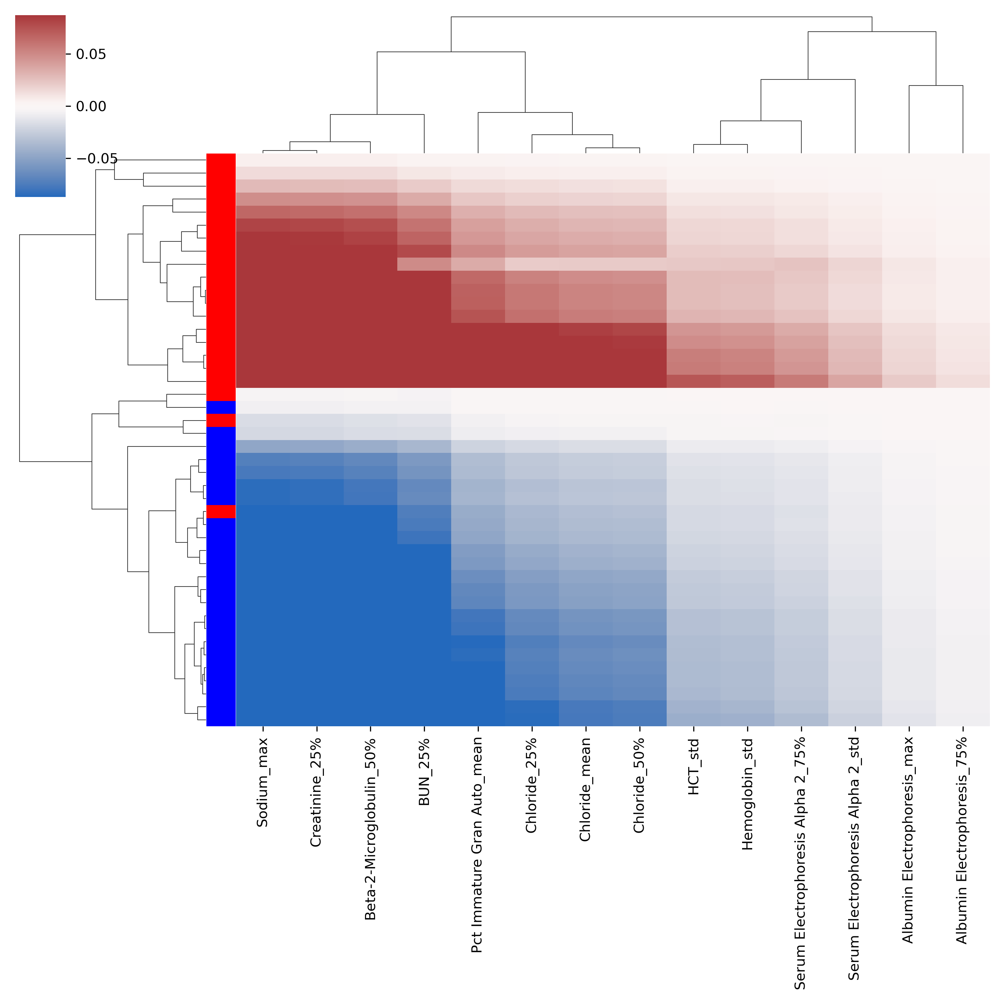

In [77]:
IG = svm_set_ranks[selected_run].integrated_gradient(X_all)
IGtable = pd.DataFrame(IG,columns=X.columns[svm_set_ranks[selected_run].features])

# IGtable.index =ID_track_all #updating index so that the plot has the patient names on it

features = svm_set_ranks[selected_run].features
IG_X = pd.DataFrame(X_all[:,features],columns = IGtable.columns)
#IG_X = X.iloc[:,features]
N = len(IGtable)

# from seaborn import pairplot, clustermap, load_dataset
# from scipy.cluster.hierarchy import linkage, dendrogram, leaves_list, fcluster

linkMeth = "average"

distMatCol = perDiff(IGtable)
hcCol = linkage(distMatCol, method=linkMeth,optimal_ordering=True)

tr_IGtable = IGtable.transpose()
distMatRow = perDiff(tr_IGtable)
hcRow = linkage(distMatRow, method=linkMeth,optimal_ordering=True)

color_val = max(np.abs((np.mean(IG)-np.std(IG), np.mean(IG)+np.std(IG))))

#fig, ax = plt.subplots()
fig = clustermap(IGtable, 
           yticklabels=False,
           cmap="vlag", vmin=-color_val, vmax=color_val,
           row_linkage=hcRow, col_linkage=hcCol, 
           row_colors=[["red","blue"][int(l==np.int64(0))+0] for l in y_all])

In [78]:
import plotly.graph_objects as go
import plotly.express as px

nbins = 10
scale = 0.1
n_features = 7
spacing = 2
min_max_IG = 2.5

fig = go.Figure()
fig.update_layout(
    plot_bgcolor='white',
    autosize=False,
    width=1000,
    height=600,
    coloraxis = {'colorscale':'Bluered'},
    xaxis_title = "Integrated Gradient",
)
 
fig.update_xaxes(
    zeroline=True,
    zerolinecolor="black",
    range = [-min_max_IG,min_max_IG]
    )
fig.update_yaxes(
    zeroline=True,
    zerolinecolor="black",
    mirror=True,
    ticks='outside',
    showline=True,
    linecolor='black',
    gridcolor='lightgrey',
    range = [-spacing, spacing*n_features + spacing]
)
 
feature_rank = np.argsort(np.sum(abs(IG),axis=0))
feature_order = feature_rank[(len(feature_rank)-n_features):len(feature_rank)] 

y_val = 1
bin_ids = list(range(nbins))
for f in feature_order:
    bins = np.linspace(IGtable.iloc[:,f].min()*1.1,IGtable.iloc[:,f].max()*1.1,nbins+1)
    ig_bins = pd.cut(IGtable.iloc[:,f], bins=bins, labels=bin_ids)
 
    x_vals = []
    y_vals = []
    f_vals = []
    for bin in bin_ids:
        x_bin_vals = list(IGtable.iloc[ig_bins[ig_bins == bin].index,f].values)
        n_pts = len(x_bin_vals)
        if n_pts > 0:
            x_vals = x_vals + x_bin_vals
            y_vals = y_vals + list(y_val + scale*(np.array(list(range(n_pts)))-(n_pts-1)/2))
            f_vals = f_vals + list(IG_X.iloc[ig_bins[ig_bins == bin].index,f].values)
    fig.add_trace(go.Scatter(
        x = x_vals, 
        y = y_vals,
        mode = 'markers',
        marker = dict(size=12,
                      color = f_vals,
                      coloraxis = "coloraxis",
                     ),
        name=IGtable.columns[f],
    ))
    y_val += spacing
 
 
fig.update_layout(showlegend=False, coloraxis_showscale=True,font=dict(size=20))
fig.update_coloraxes(colorbar_showticklabels=False,
                    colorbar_title=dict(text="Feature Value",side = "right"),
                    cmin = -1, cmax = 1)
fig.update_yaxes(tickvals=[1]+[1 + spacing*i for i in range(1,n_features)], 
                 ticktext=IGtable.columns[feature_order])
 
fig.show()

In [79]:
nbins = 10
scale = 0.1
n_features = len(X.columns[svm_set_ranks[selected_run].sorted_features.astype(int)[:svm_set_ranks[selected_run].performance_["num_features"]]].values)
spacing = 2
min_max_IG = 2.5

fig = go.Figure()
fig.update_layout(
    plot_bgcolor='white',
    autosize=False,
    width=1000,
    height=2000,
    coloraxis = {'colorscale':'Bluered'},
    xaxis_title = "Integrated Gradient",
)
 
fig.update_xaxes(
    zeroline=True,
    zerolinecolor="black",
    range = [-min_max_IG,min_max_IG]
    )
fig.update_yaxes(
    zeroline=True,
    zerolinecolor="black",
    mirror=True,
    ticks='outside',
    showline=True,
    linecolor='black',
    gridcolor='lightgrey',
    range = [-spacing, spacing*n_features + spacing]
)
 
feature_rank = np.argsort(np.sum(abs(IG),axis=0))
feature_order = feature_rank[(len(feature_rank)-n_features):len(feature_rank)] 

y_val = 1
bin_ids = list(range(nbins))
for f in feature_order:
    bins = np.linspace(IGtable.iloc[:,f].min()*1.1,IGtable.iloc[:,f].max()*1.1,nbins+1)
    ig_bins = pd.cut(IGtable.iloc[:,f], bins=bins, labels=bin_ids)
 
    x_vals = []
    y_vals = []
    f_vals = []
    for bin in bin_ids:
        x_bin_vals = list(IGtable.iloc[ig_bins[ig_bins == bin].index,f].values)
        n_pts = len(x_bin_vals)
        if n_pts > 0:
            x_vals = x_vals + x_bin_vals
            y_vals = y_vals + list(y_val + scale*(np.array(list(range(n_pts)))-(n_pts-1)/2))
            f_vals = f_vals + list(IG_X.iloc[ig_bins[ig_bins == bin].index,f].values)
    fig.add_trace(go.Scatter(
        x = x_vals, 
        y = y_vals,
        mode = 'markers',
        marker = dict(size=12,
                      color = f_vals,
                      coloraxis = "coloraxis",
                     ),
        name=IGtable.columns[f],
    ))
    y_val += spacing
 
 
fig.update_layout(showlegend=False, coloraxis_showscale=True,font=dict(size=20))
fig.update_coloraxes(colorbar_showticklabels=False,
                    colorbar_title=dict(text="Feature Value",side = "right"),
                    cmin = -1, cmax = 1)
fig.update_yaxes(tickvals=[1]+[1 + spacing*i for i in range(1,n_features)], 
                 ticktext=IGtable.columns[feature_order])
 
fig.show()

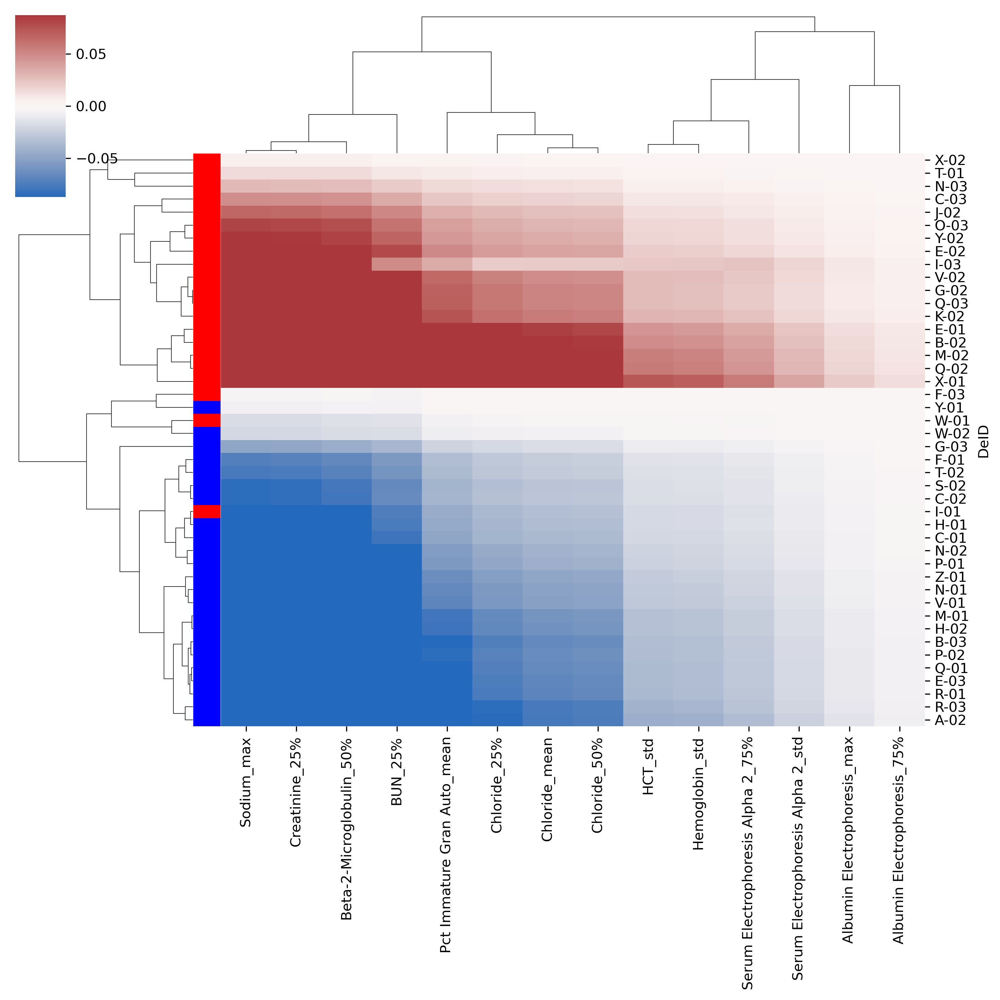

In [80]:
IGtable.index =ID_track_all #updating index so that the plot has the patient names on it

fig = clustermap(IGtable, 
           yticklabels=True,
           cmap="vlag", vmin=-color_val, vmax=color_val,
           row_linkage=hcRow, col_linkage=hcCol, 
           row_colors=[["red","blue"][int(l==np.int64(0))+0] for l in y_all])

In [81]:
feat_1 = IGtable.columns[feature_order[1]]
feat_2 = IGtable.columns[feature_order[2]]

fig = px.scatter(x = IG_X[feat_1], y = IGtable[feat_1], color = IG_X[feat_2])
fig.update_traces(marker=dict(size=12))

fig.update_layout(
    plot_bgcolor='white',
    autosize=False,
    width=800,
    height=800,
    coloraxis = {'colorscale':'Bluered'},
    xaxis_title = feat_1,
    yaxis_title = "Integrated Gradient for " + feat_1,
    font=dict(size=20)
)

fig.update_xaxes(
    zeroline=True,
    zerolinecolor='lightgrey',
    mirror=True,
    ticks='outside',
    showline=True,
    linecolor='black',
    gridcolor='lightgrey'
    )
    
fig.update_yaxes(
    zeroline=True,
    zerolinecolor='lightgrey',
    mirror=True,
    ticks='outside',
    showline=True,
    linecolor='black',
    gridcolor='lightgrey'
)

fig.update_coloraxes(colorbar_showticklabels=False,
                    colorbar_title=dict(text=feat_2,side = "right"),
                    cmin = -1, cmax = 1)

fig.show()

In [82]:
# feat_1 = IGtable.columns[feature_order[5]]
# feat_2 = IGtable.columns[feature_order[6]]

# fig = px.scatter(x = IG_X[feat_1], y = IGtable[feat_1], color = IG_X[feat_2])
# fig.update_traces(marker=dict(size=12))

# fig.update_layout(
#     plot_bgcolor='white',
#     autosize=False,
#     width=800,
#     height=800,
#     coloraxis = {'colorscale':'Bluered'},
#     xaxis_title = feat_1,
#     yaxis_title = "Integrated Gradient for " + feat_1,
#     font=dict(size=20)
# )

# fig.update_xaxes(
#     zeroline=True,
#     zerolinecolor='lightgrey',
#     mirror=True,
#     ticks='outside',
#     showline=True,
#     linecolor='black',
#     gridcolor='lightgrey'
#     )
    
# fig.update_yaxes(
#     zeroline=True,
#     zerolinecolor='lightgrey',
#     mirror=True,
#     ticks='outside',
#     showline=True,
#     linecolor='black',
#     gridcolor='lightgrey'
# )

# fig.update_coloraxes(colorbar_showticklabels=False,
#                     colorbar_title=dict(text=feat_2,side = "right"),
#                     cmin = -1, cmax = 1)

# fig.show()

### test set with support vectors

#### finding support vectors and feature order

In [ ]:
#setting feature order equal to feature rank because feature order if altered by number of features plotted in shap plot for the abridged SHAP plot
feature_order = np.argsort(np.sum(abs(IG),axis=0))
#features are ordered from least important to most important

In [83]:
supportVectorIDs = ID_track_train[pd.DataFrame([svm_set_ranks[selected_run].models[i].support_ for i in range(5)]).melt()['value'].dropna().unique()]
print("List of support vectors: \n") 
print(supportVectorIDs)
print("IGtable columns: \n") 
print( IGtable.columns[feature_order])
print("List of IG_X columns: \n")
print(IG_X.columns)

List of support vectors: 

15    X-02
14    X-01
16    A-02
17    C-02
19    H-01
18    E-03
20    H-02
21    M-01
22    N-01
24    P-01
23    N-02
25    P-02
26    R-01
27    R-03
0     C-03
2     E-02
3     G-02
1     E-01
4     I-03
5     J-02
7     M-02
6     K-02
9     O-03
10    Q-02
12    V-02
11    Q-03
Name: DeID, dtype: object
IGtable columns: 

Index(['Albumin Electrophoresis_75%', 'Albumin Electrophoresis_max',
       'Serum Electrophoresis Alpha 2_std',
       'Serum Electrophoresis Alpha 2_75%', 'Hemoglobin_std', 'HCT_std',
       'Chloride_50%', 'Chloride_mean', 'Chloride_25%',
       'Pct Immature Gran Auto_mean', 'BUN_25%', 'Beta-2-Microglobulin_50%',
       'Creatinine_25%', 'Sodium_max'],
      dtype='object')
List of IG_X columns: 

Index(['Albumin Electrophoresis_75%', 'Albumin Electrophoresis_max', 'BUN_25%',
       'Beta-2-Microglobulin_50%', 'Chloride_mean', 'Chloride_25%',
       'Chloride_50%', 'Creatinine_25%', 'HCT_std', 'Hemoglobin_std',
       'Pct Immatur

#### IG plot of test and support vectors

In [84]:
IG_X_all_labeled = IG_X
IG_X_all_labeled.index = ID_track_all #make indexable so that you can find the patients you need
support_vector_IG = IG_X_all_labeled.loc[supportVectorIDs]
testpts_vector_IG = IG_X_all_labeled.loc[ID_track_test]

IGtable_labeled = IGtable
IGtable_labeled.index = ID_track_all #make indexable by patient ID
support_vector_IGtable = IGtable_labeled.loc[supportVectorIDs]
testpts_vector_IGtable = IGtable_labeled.loc[ID_track_test]

In [85]:
testpts_vector_IGtable['Shape'] = ['diamond' for i in range(len(ID_track_test))]
support_vector_IGtable['Shape'] = ['circle' for i in range(len(support_vector_IG))]

In [86]:
#make dataframes for the combination of both the test patients and unique support vectors
IGtable_concat = pd.concat([support_vector_IGtable, testpts_vector_IGtable])
IG_x_concat =pd.concat([support_vector_IG, testpts_vector_IG])

In [87]:
IGtable_concat['DeID']= IGtable_concat.index #text for the plots

In [88]:
feat_1 = IGtable.columns[feature_order[1]]
feat_2 = IGtable.columns[feature_order[2]]

# fig = px.scatter(x = IG_X[feat_1], y = IGtable[feat_1], text= ID_track_all, color = IG_X[feat_2])
# fig.update_traces(marker=dict(size=12), textposition = 'top center')


fig=px.scatter(x = IG_x_concat[feat_1], y = IGtable_concat[feat_1], 
                 text= IGtable_concat['DeID'], 
                 color = IG_x_concat[feat_2],
                 symbol = IGtable_concat['Shape'], size = [0.5 for i in range(len(IGtable_concat['DeID']))]
                )

# fig.update_traces(marker=dict(size=12, symbol = 'square'), textposition = 'top center')
fig.update_traces(textposition = 'top center')



fig.update_layout(
    plot_bgcolor='white',
    autosize=False,
    width=800,
    height=800,
    coloraxis = {'colorscale':'Bluered'},
    xaxis_title = feat_1,
    yaxis_title = "Integrated Gradient for " + feat_1,
    font=dict(size=20)
)

fig.update_xaxes(
    zeroline=True,
    zerolinecolor='lightgrey',
    mirror=True,
    ticks='outside',
    showline=True,
    linecolor='black',
    gridcolor='lightgrey'
    )
    
fig.update_yaxes(
    zeroline=True,
    zerolinecolor='lightgrey',
    mirror=True,
    ticks='outside',
    showline=True,
    linecolor='black',
    gridcolor='lightgrey'
)

fig.update_coloraxes(colorbar_showticklabels=True,
                    colorbar_title=dict(text=feat_2,side = "right"),
                    cmin = -1, cmax = 1)

fig.show()

## IG tables with only test set

In [89]:
pd.concat([y_train,pd.DataFrame(svm_set_ranks[selected_run].decision_function(X_train), index = ID_track_train)], axis = 1)

,CA_status_yes,0
DeID,,
C-03,1,0.303956
E-01,1,1.444119
E-02,1,0.663368
G-02,1,0.898967
I-03,1,0.596981
J-02,1,0.422843
K-02,1,0.992679
M-02,1,1.836818
N-03,1,0.183253


In [90]:
pd.concat([y_test,pd.DataFrame(svm_set_ranks[selected_run].decision_function(X_test), index = ID_track_test)], axis = 1)

,CA_status_yes,0
DeID,,
T-01,1,0.089162
B-02,1,1.551468
I-01,1,-0.600038
Y-02,1,0.561924
F-03,1,-0.029854
B-03,0,-1.136866
F-01,0,-0.456306
G-03,0,-0.302916
Q-01,0,-1.160722


In [91]:
IG = svm_set_ranks[selected_run].integrated_gradient(X_test)
IGtable = pd.DataFrame(IG,columns=X.columns[svm_set_ranks[selected_run].features])

/blue/ferrallm/mcremer/CardiacAmyloidosisMultipleMyeloma/mistic/utility.py:223: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

/blue/ferrallm/mcremer/CardiacAmyloidosisMultipleMyeloma/mistic/utility.py:223: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`



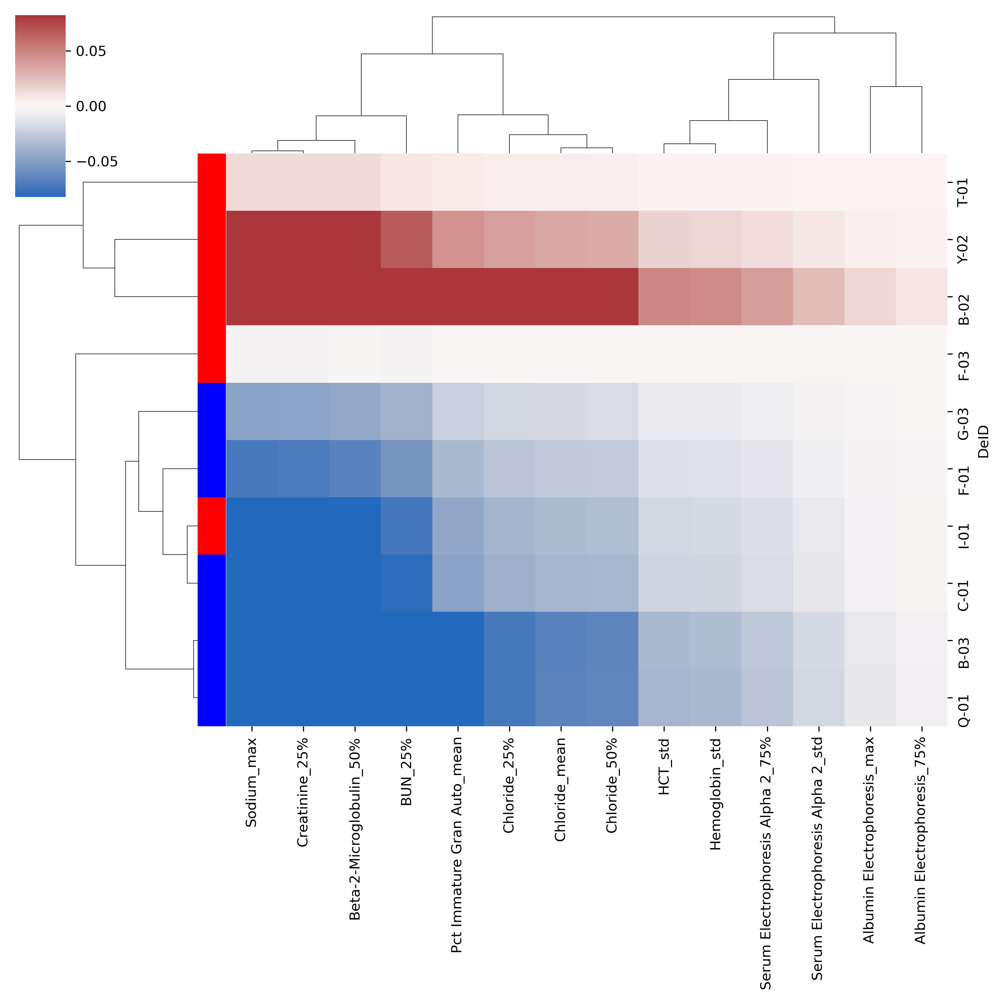

In [92]:
IGtable.index =ID_track_test #updating index so that the plot has the patient names on it

features = svm_set_ranks[selected_run].features
IG_X = pd.DataFrame(X_test[:,features],columns = IGtable.columns)
#IG_X = X.iloc[:,features]
N = len(IGtable)


linkMeth = "average"

distMatCol = perDiff(IGtable)
hcCol = linkage(distMatCol, method=linkMeth,optimal_ordering=True)

tr_IGtable = IGtable.transpose()
distMatRow = perDiff(tr_IGtable)
hcRow = linkage(distMatRow, method=linkMeth,optimal_ordering=True)

color_val = max(np.abs((np.mean(IG)-np.std(IG), np.mean(IG)+np.std(IG))))

#fig, ax = plt.subplots()
fig = clustermap(IGtable, 
           yticklabels=True,
           cmap="vlag", vmin=-color_val, vmax=color_val,
           row_linkage=hcRow, col_linkage=hcCol, 
           row_colors=[["red","blue"][int(l==np.int64(0))+0] for l in y_test])

# sensitivity and specificity 

In [93]:
decision_values = svm_set_ranks[selected_run].decision_function(X_test)
y_pred = svm_set_ranks[selected_run].predict(X_test)

tn, fp, fn, tp = confusion_matrix(y_test, y_pred).ravel()
precision = tp/(tp+fp)
recall = tp/(tp+fn)
specificity = tn/(tn + fp)
f1 = 2*precision*recall/(precision+recall)
auc = roc_auc_score(y_test, decision_values)

print("True Negative: ", tn)
print("false positive: ", fp)
print("false negative: ", fn)
print("true positive: ", tp)
print("true positive rate or recall/sensitivity: ", recall)
print("positive predictive value or precision: ", precision)
print("specificity or true negatie rate: ", specificity)
print("auc: ", auc)
print("f1 score: ", f1)

True Negative:  5
false positive:  0
false negative:  2
true positive:  3
true positive rate or recall/sensitivity:  0.6
positive predictive value or precision:  1.0
specificity or true negatie rate:  1.0
auc:  0.92
f1 score:  0.7499999999999999


# testing alt models on best feature list

In [94]:
X_all_trim = X_all[:,svm_set_ranks[selected_run].sorted_features.astype(int)[:svm_set_ranks[selected_run].performance_["num_features"]]]
X_train_trim = X_train[:,svm_set_ranks[selected_run].sorted_features.astype(int)[:svm_set_ranks[selected_run].performance_["num_features"]]]
X_test_trim = X_test[:,svm_set_ranks[selected_run].sorted_features.astype(int)[:svm_set_ranks[selected_run].performance_["num_features"]]]
#making the dataset only include the features from the best performing model in SVM

In [95]:
cv_set_trim = cvSet(X = X_train_trim, y = y_train.values)
cv_set_trim.classification(num_sets = numb_sets)

F1:  0.3333333333333333
ROC:  0.6


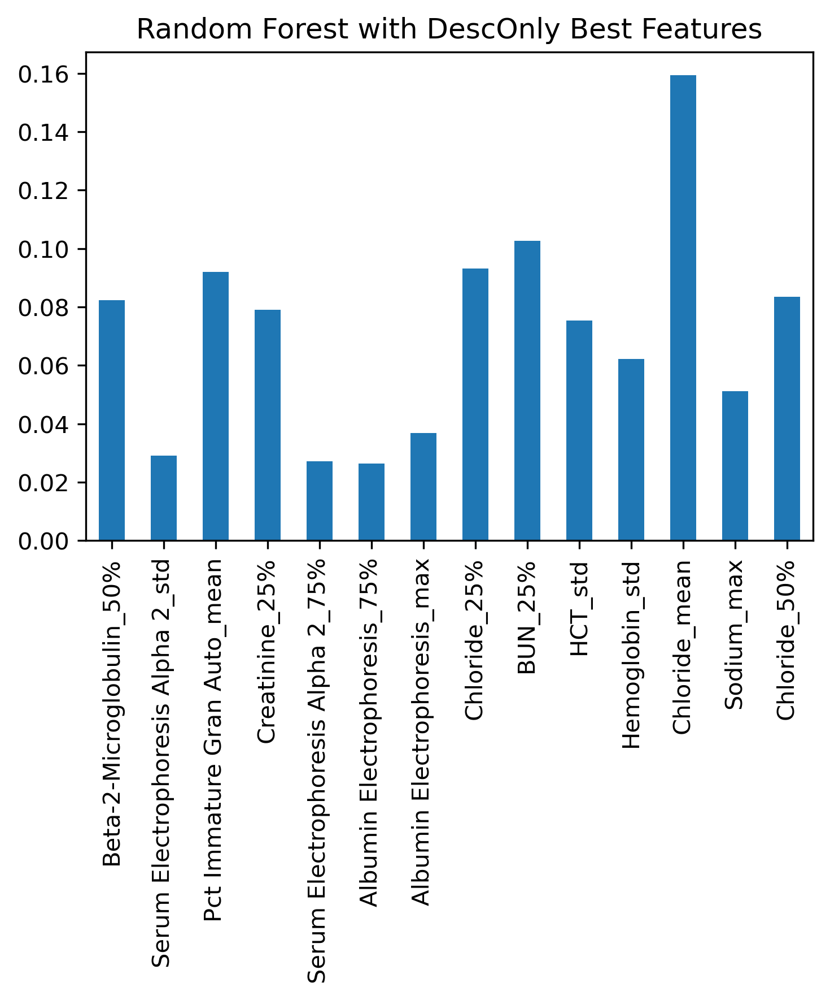

In [96]:
rnd_clf = RandomForestClassifier(random_state=0)
rnd_clf.fit(X_train_trim, y_train)
y_pred = rnd_clf.predict(X_test_trim)

print("F1: ", f1_score(y_test, y_pred, average = 'binary'))
print("ROC: ", roc_auc_score(y_test, y_pred))
importances = rnd_clf.feature_importances_
forest_importances = pd.Series(importances, index= X.columns[svm_set_ranks[selected_run].sorted_features.astype(int)[:svm_set_ranks[selected_run].performance_["num_features"]]].values)
fig, ax = plt.subplots(figsize = (5,6))
forest_importances.plot.bar(ax=ax)
ax.set_title("Random Forest with DescOnly Best Features")
fig.tight_layout()

F1:  0.5
ROC:  0.6


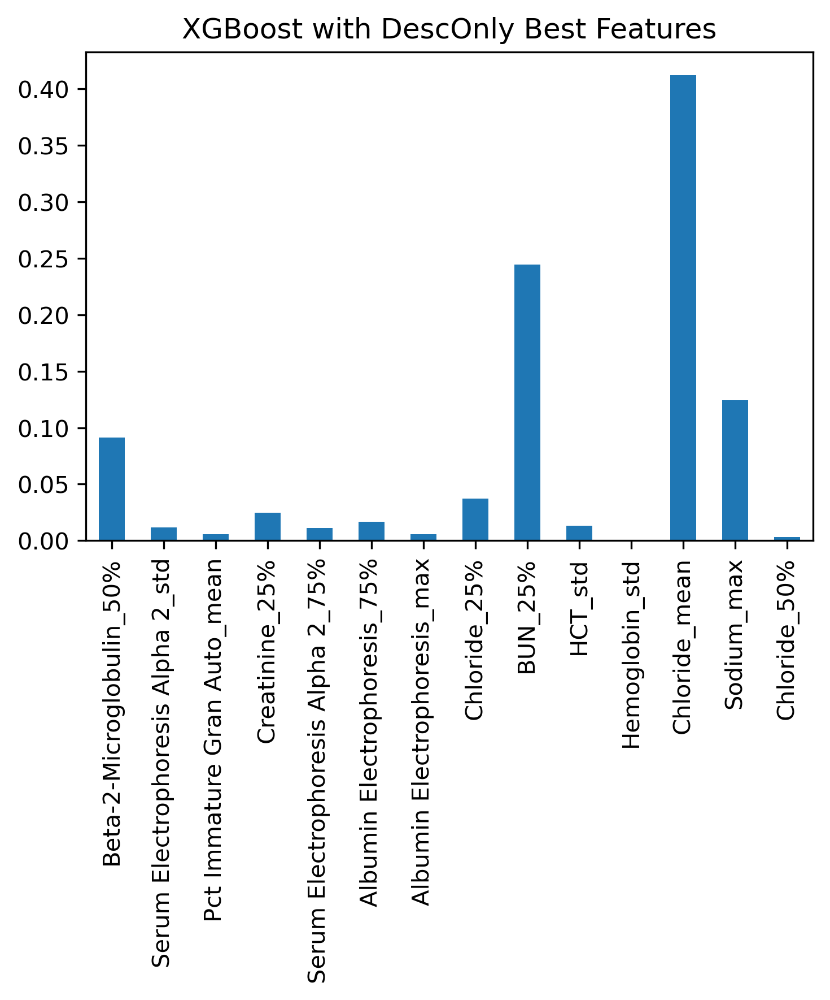

In [97]:
xgb_clf = XGBClassifier()
xgb_clf.fit(X_train_trim, y_train)
y_pred = xgb_clf.predict(X_test_trim)

print("F1: ", f1_score(y_test, y_pred, average = 'binary'))
print("ROC: ", roc_auc_score(y_test, y_pred))

importances_xgb = xgb_clf.feature_importances_
xgb_importances = pd.Series(importances_xgb, index= X.columns[svm_set_ranks[selected_run].sorted_features.astype(int)[:svm_set_ranks[selected_run].performance_["num_features"]]].values)
fig, ax = plt.subplots(figsize = (5,6))
xgb_importances.plot.bar(ax=ax)
ax.set_title("XGBoost with DescOnly Best Features")
fig.tight_layout()

In [98]:
# paramsLGBM = {
#     'objective': 'binary',
#     'boosting_type':'gbdt',
#     # 'num_leaves' : 45, 
#     'learning_rate' : 0.05,
#     'feature_fraction' : 0.90,
#     'min_data_in_leaf': 1
# }

# lgb_clf = lgb.LGBMClassifier(**paramsLGBM)
# lgb_clf.fit(X_train_trim, y_train)
# y_pred = lgb_clf.predict(X_test_trim)

# print("F1: ", f1_score(y_test, y_pred, average = "binary"))
# print("ROC: ", roc_auc_score(y_test, y_pred))
# print(classification_report(y_test, y_pred))

In [99]:
# #borrowed from online source
# #shap explainer
# explainer = shap.TreeExplainer(lgb_clf)

# #binary predictions
# y_proba = lgb_clf.predict_proba(X_all_trim)[:,1]

# # Calculate SHAP values for the test set
# shap_values = explainer.shap_values(X_all_trim)

# shap.summary_plot(shap_values, X_all_trim, feature_names = X.columns[svm_set_ranks[selected_run].sorted_features.astype(int)[:svm_set_ranks[selected_run].performance_["num_features"]]].values)

# # Show the plot
# plt.show()

# exporting selected features to dataframe

In [100]:
selected_features = list(X.columns[svm_set_ranks[selected_run].features]) #getting list of selected features
dataTablePositive = dataTable[dataTable[y_column_Classification] == 1] #filtering for positive patients
dataTablePositive.index = dataTablePositive['DeID'] #setting index to patient id
dataTableNegative = dataTable[dataTable[y_column_Classification] == 0] #filtering for negative patients
dataTableNegative.index = dataTableNegative['DeID'] #setting index to patient id
df_selectedfeatures_allpts = dataTable[selected_features]
df_selectedfeatures_allpts.index = dataTable['DeID'] #adding the patient identifiers back to the dataframe


#saving this output to a sheet
outputToExcel(df_data = df_selectedfeatures_allpts[selected_features], fileName_header= "SelectedFeats_", fileName_Common= fileName_common, fileName_suffix= fileName_suffix,
                    parent_dir= saving_dirrectory, folderName=makingFolder, sheetName= "all")
outputToExcel(df_data = dataTablePositive[selected_features], fileName_header= "SelectedFeats_", fileName_Common= fileName_common, fileName_suffix= fileName_suffix,
                    parent_dir= saving_dirrectory, folderName=makingFolder, sheetName= "positive")
outputToExcel(df_data = dataTableNegative[selected_features], fileName_header= "SelectedFeats_", fileName_Common= fileName_common, fileName_suffix= fileName_suffix,
                    parent_dir= saving_dirrectory, folderName=makingFolder, sheetName= "negative")


# correlation and heat maps for the best performing features of the SVM model

In [101]:
import seaborn as sns

In [102]:
dataTable

,DeID,CA_status_yes,sex_female,dx_mgus,dx_mm,age,survival(mo),ChemoTx,HematologicTx,RadiationTx,...,NT Pro BNP_50%,NT Pro BNP_75%,NT Pro BNP_max,Troponin-T_mean,Troponin-T_std,Troponin-T_min,Troponin-T_25%,Troponin-T_50%,Troponin-T_75%,Troponin-T_max
DeID,,,,,,,,,,,,,,,,,,,,,
B-02,B-02,1,0,1,0,48,9.466667,0,0,0,...,3660.5,5185.25,6710,0.064000,0.069296,0.015,0.03950,0.0640,0.08850,0.113
C-03,C-03,1,1,0,1,59,17.000000,2,0,0,...,3321.0,4270.00,6794,0.321429,0.114842,0.166,0.24750,0.3070,0.39500,0.492
E-01,E-01,1,0,1,0,50,71.300000,0,0,0,...,1260.0,1548.00,2970,0.020333,0.015756,0.000,0.00000,0.0280,0.03150,0.040
E-02,E-02,1,0,1,0,64,20.466667,0,0,0,...,16284.0,28544.00,40804,0.087667,0.021502,0.066,0.07700,0.0880,0.09850,0.109
F-03,F-03,1,0,0,1,61,52.000000,4,1,0,...,130.0,148.00,166,0.000000,0.000000,0.000,0.00000,0.0000,0.00000,0.000
G-02,G-02,1,1,0,1,36,30.000000,0,0,0,...,5527.0,6661.00,10943,0.057462,0.015650,0.037,0.04500,0.0500,0.06900,0.086
I-01,I-01,1,1,0,1,55,33.000000,4,0,0,...,546.0,1397.50,2220,0.000000,0.000000,0.000,0.00000,0.0000,0.00000,0.000
I-03,I-03,1,0,1,0,67,10.033333,0,0,0,...,176.0,245.00,314,0.000000,0.000000,0.000,0.00000,0.0000,0.00000,0.000
J-02,J-02,1,1,0,1,68,26.000000,1,0,0,...,1059.0,3428.00,9293,0.009500,0.013435,0.000,0.00475,0.0095,0.01425,0.019


In [103]:
# create correlation matrix for all the input features
feature_correlation = dataTable.drop(columns= 'DeID').corr(method='spearman')
selected_features = list(X.columns[svm_set_ranks[selected_run].features])

#for CA positive
feature_correlation_CApositive = dataTable[dataTable[y_column_Classification] == 1].drop(columns = "DeID").corr(method='spearman')

#for CA negative
feature_correlation_CAnegative = dataTable[dataTable[y_column_Classification] == 0].drop(columns = "DeID").corr(method='spearman')

In [104]:
outputToExcel(df_data = feature_correlation, fileName_header= "featureCorr_", fileName_Common= fileName_common, fileName_suffix= fileName_suffix,
                    parent_dir= saving_dirrectory, folderName=makingFolder, sheetName= "all")
outputToExcel(df_data = feature_correlation_CApositive, fileName_header= "featureCorr_", fileName_Common= fileName_common, fileName_suffix= fileName_suffix,
                    parent_dir= saving_dirrectory, folderName=makingFolder, sheetName= "allCApos")
outputToExcel(df_data = feature_correlation_CAnegative, fileName_header= "featureCorr_", fileName_Common= fileName_common, fileName_suffix= fileName_suffix,
                    parent_dir= saving_dirrectory, folderName=makingFolder, sheetName= "allCAneg")

/blue/ferrallm/mcremer/.conda/envs/mcremerConda_2024-07-15_v1/lib/python3.12/site-packages/openpyxl/workbook/child.py:99: UserWarning:

Title is more than 31 characters. Some applications may not be able to read the file



In [105]:
colormap = "RdBu"

/blue/ferrallm/mcremer/.conda/envs/mcremerConda_2024-07-15_v1/lib/python3.12/site-packages/openpyxl/workbook/child.py:99: UserWarning:

Title is more than 31 characters. Some applications may not be able to read the file

/blue/ferrallm/mcremer/.conda/envs/mcremerConda_2024-07-15_v1/lib/python3.12/site-packages/openpyxl/workbook/child.py:99: UserWarning:

Title is more than 31 characters. Some applications may not be able to read the file

/blue/ferrallm/mcremer/.conda/envs/mcremerConda_2024-07-15_v1/lib/python3.12/site-packages/openpyxl/workbook/child.py:99: UserWarning:

Title is more than 31 characters. Some applications may not be able to read the file

/blue/ferrallm/mcremer/.conda/envs/mcremerConda_2024-07-15_v1/lib/python3.12/site-packages/openpyxl/workbook/child.py:99: UserWarning:

Title is more than 31 characters. Some applications may not be able to read the file

/blue/ferrallm/mcremer/.conda/envs/mcremerConda_2024-07-15_v1/lib/python3.12/site-packages/openpyxl/workbook/chi

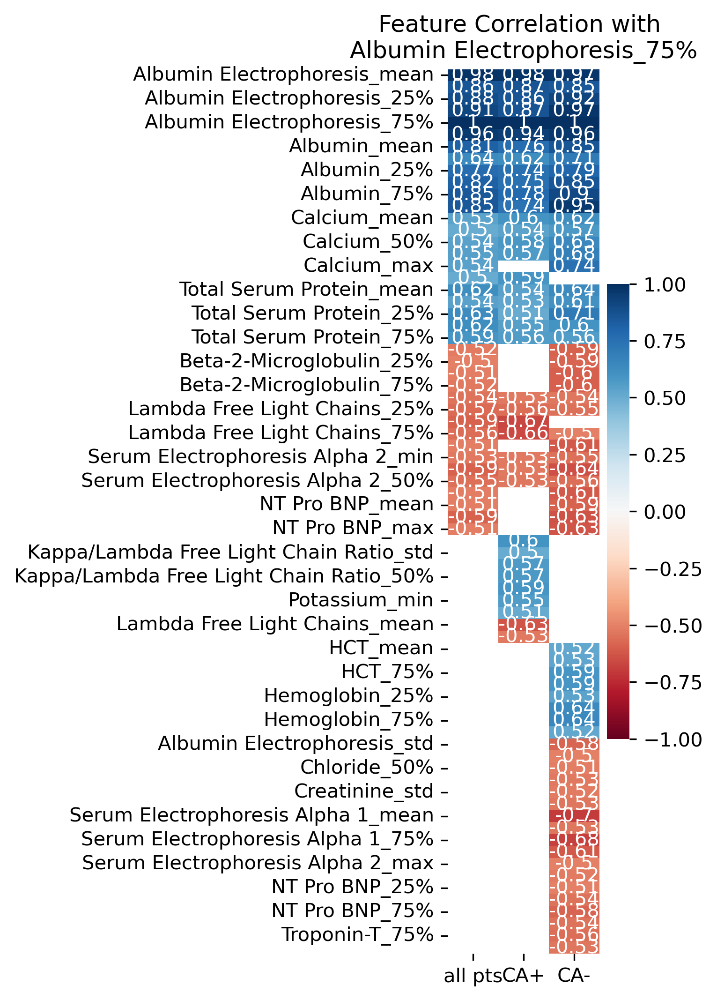

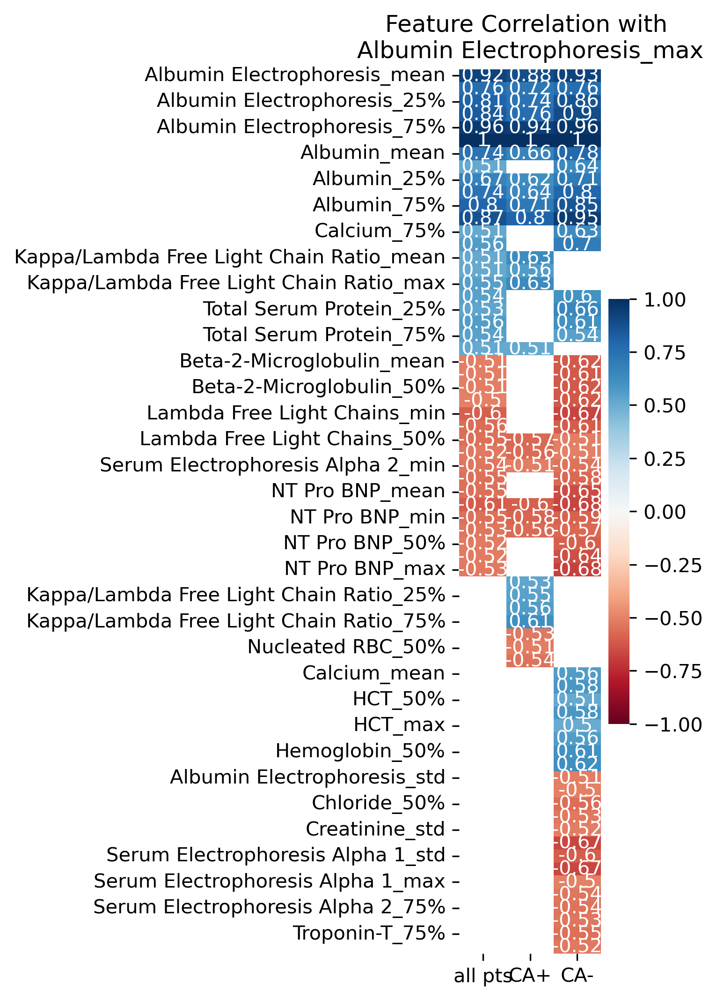

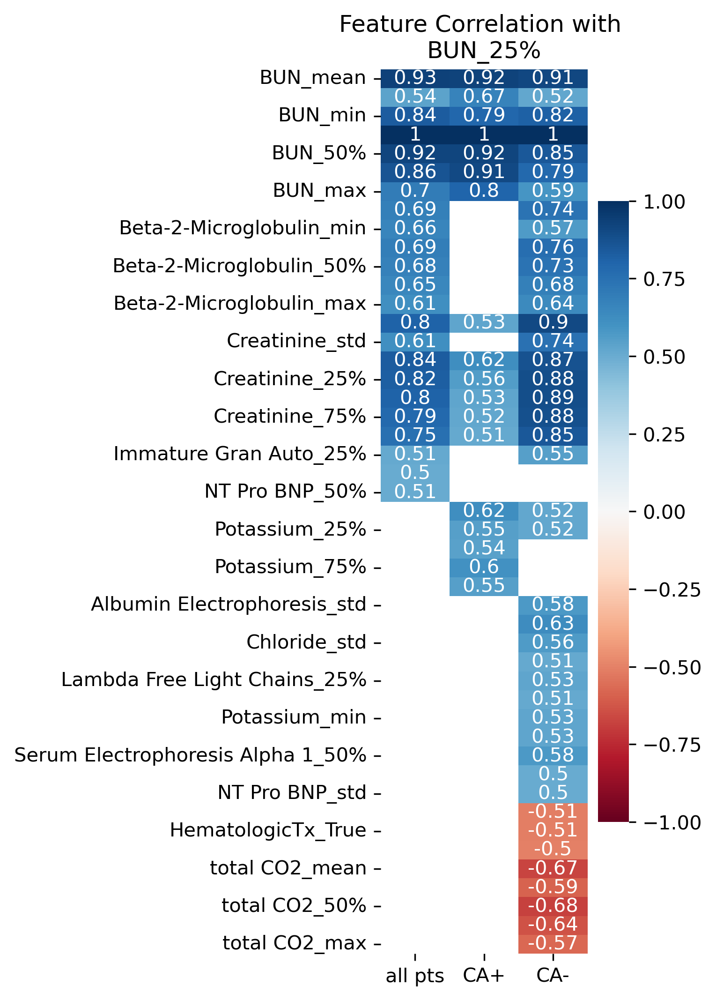

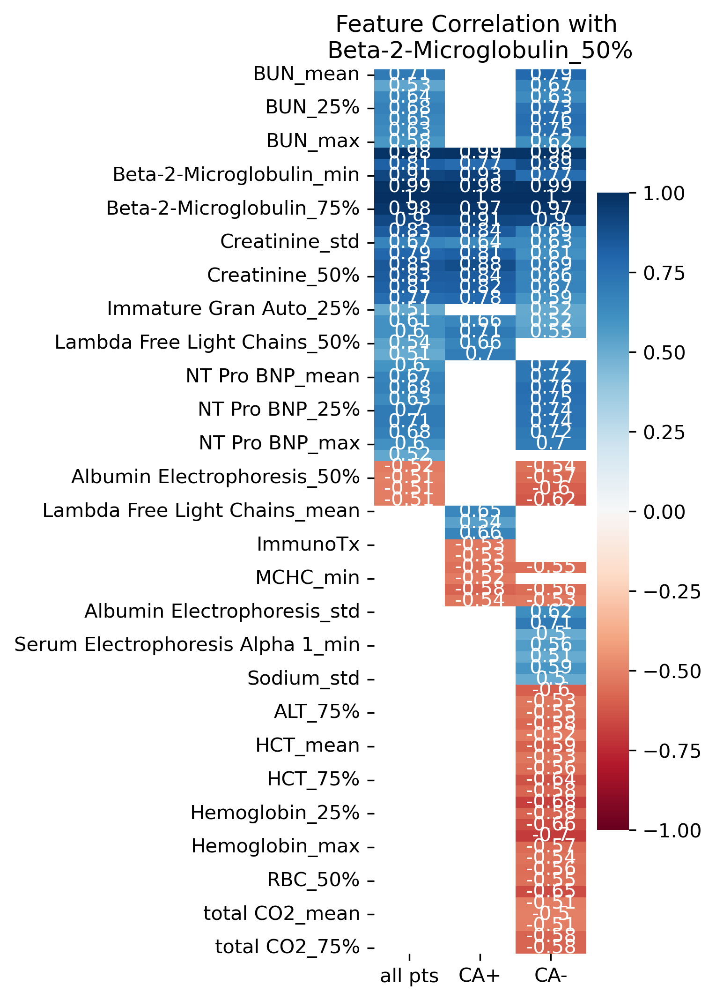

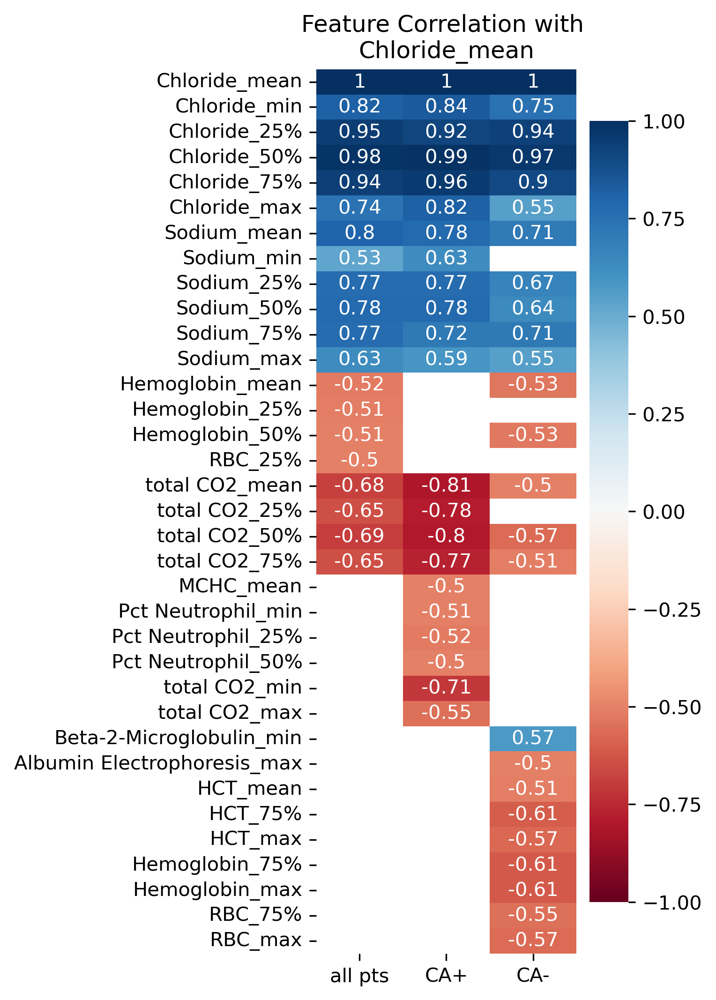

...

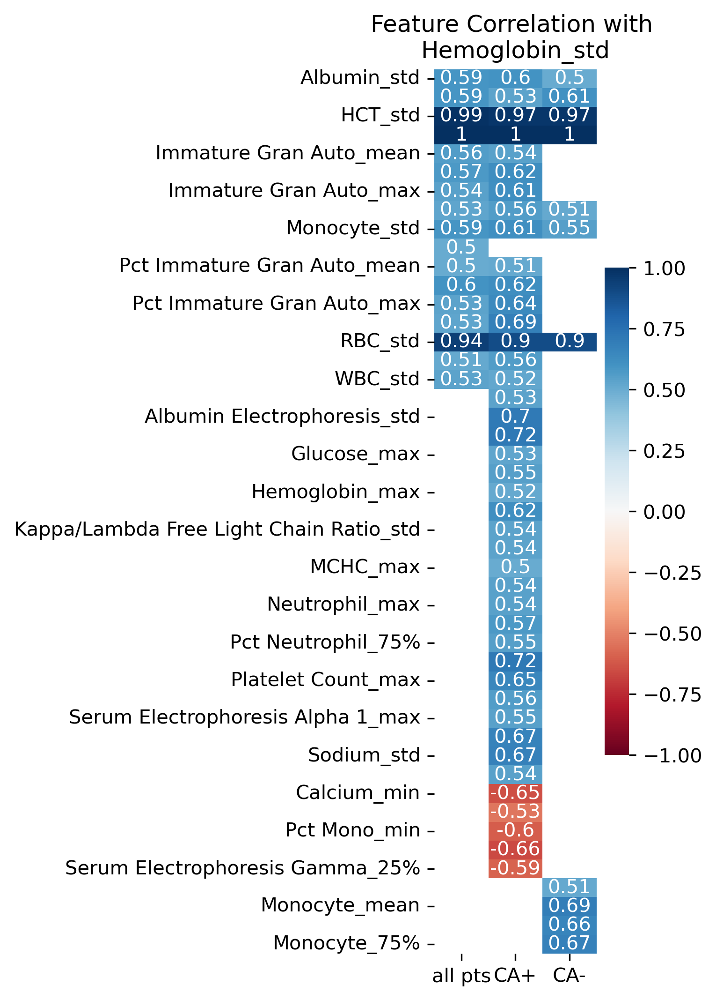

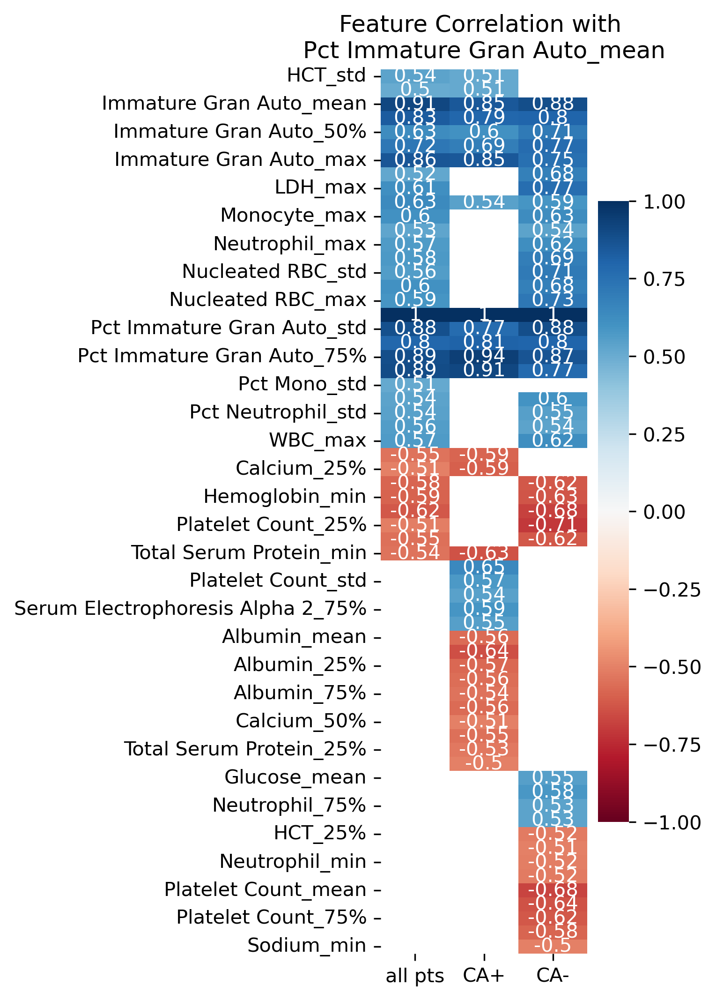

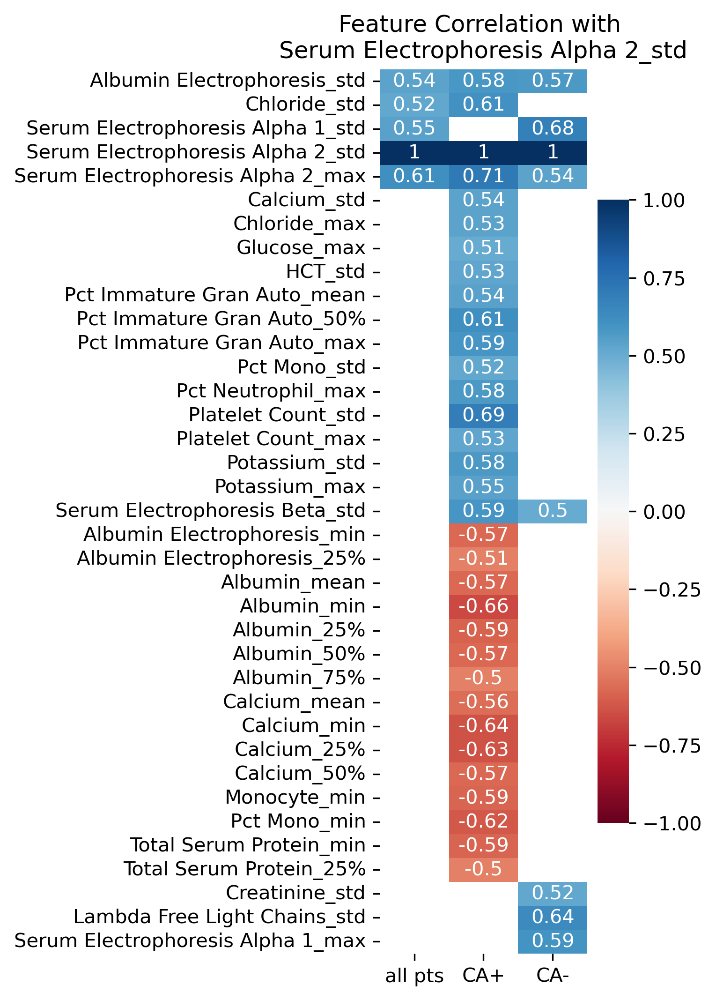

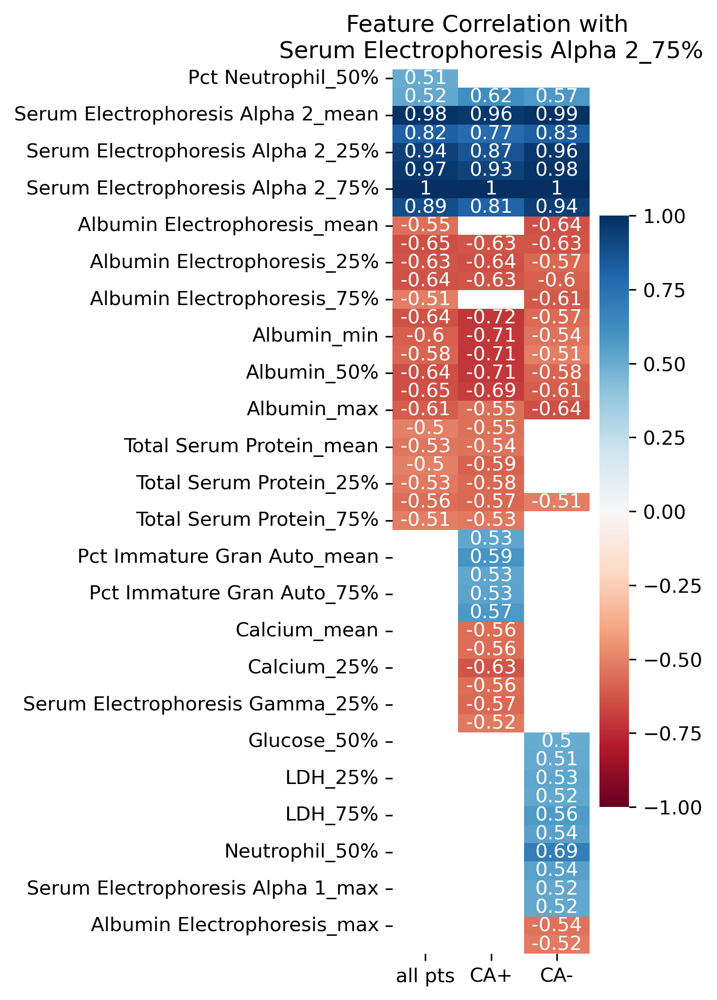

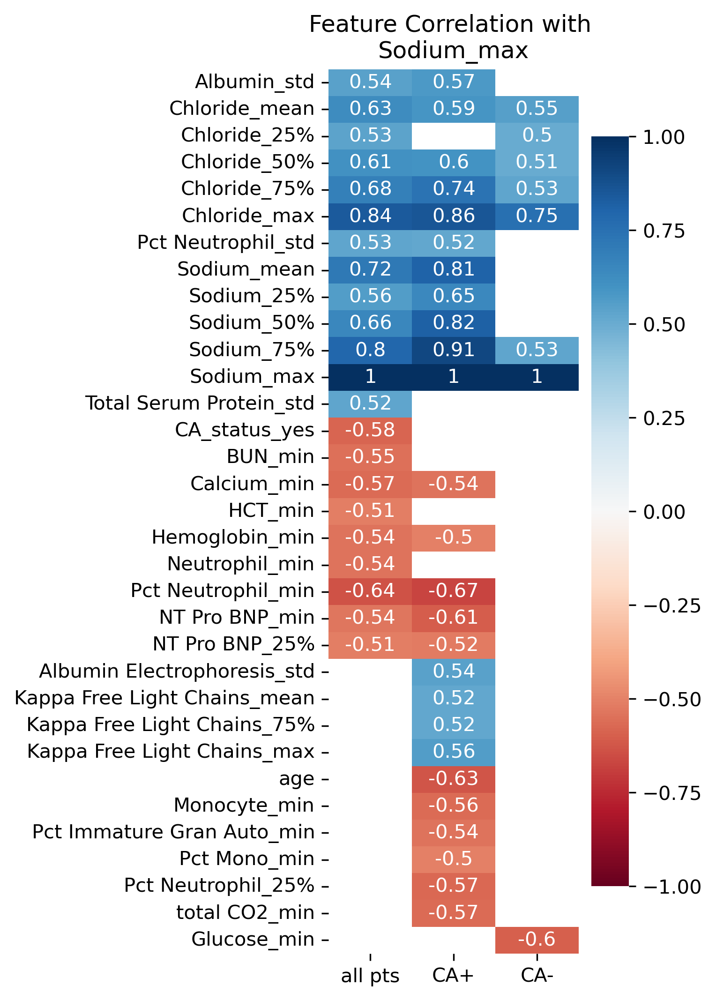

In [106]:
for feature_name in selected_features:
    feat_corr_sig_allpts = pd.concat([feature_correlation[feature_correlation[feature_name]>=0.5][feature_name], 
                                    feature_correlation[feature_correlation[feature_name]<=-0.5][feature_name]], axis = 0)

    feat_corr_sig_CApos = pd.concat([feature_correlation_CApositive[feature_correlation_CApositive[feature_name]>=0.5][feature_name], 
                                     feature_correlation_CApositive[feature_correlation_CApositive[feature_name]<=-0.5][feature_name]], axis = 0)

    feat_corr_sig_CAneg = pd.concat([feature_correlation_CAnegative[feature_correlation_CAnegative[feature_name]>=0.5][feature_name],
                                     feature_correlation_CAnegative[feature_correlation_CAnegative[feature_name]<=-0.5][feature_name]], axis = 0)

    feat_corr_sig_concat = pd.concat([feat_corr_sig_allpts,feat_corr_sig_CApos,feat_corr_sig_CAneg], axis = 1)
    feat_corr_sig_concat.columns = ['all pts', 'CA+', 'CA-']

    outputToExcel(df_data = feat_corr_sig_concat, fileName_header= "featureCorr_", fileName_Common= fileName_common, fileName_suffix= fileName_suffix ,
                       parent_dir= saving_dirrectory, folderName=makingFolder, sheetName=feature_name.replace("%", "").replace("/",""))

    fig, ax = plt.subplots(figsize = (5,7),layout = 'constrained')
    sns.heatmap(feat_corr_sig_concat, cmap= colormap, vmin= -1, vmax = 1, center = 0, annot = True, ax = ax)
    ax.set_title("Feature Correlation with \n"+ str(feature_name))

    figCommon =feature_name.replace("%", "").replace("/","") + "_heatmap_"
    # fig_file_out = ptFn.outputFiguresPath(fileName_header="", fileName_mid=figCommon, 
    #                         fileName_suff= fileNameSuffix, parent_dir=parent_dir, folderName=folder_data_out)
    # fig.savefig(fig_file_out, bbox_inches = 'tight')
    # fig_file_out_jpg = ptFn.outputFiguresPath(fileName_header="", fileName_mid=figCommon, 
    #                 fileName_suff= fileNameSuffix, parent_dir=parent_dir, folderName=folder_data_out, fileExtension= '.jpg')
    # fig.savefig(fig_file_out_jpg, bbox_inches = 'tight')